# <center> Telecom Churn Prediction In South Asia

<h5>Kranthi Kumar Valaboju</h5>

<img src="Customer Churn.jpg">

## Description

 - In the Telecom Industry, Customers are able to choose from multiple service providers and actively switch from one Operator to another.
 - The Technical Progress and the Increasing Number of Operators Raised the Level of Competition.
 - Three main Strategies have been Proposed to Generate More Revenues: 
     - Acquire New Customers
     - Upsell the Existing Customers
     - Increase the Retention Period of Customers</br>     
 - However, Comparing these Strategies Taking the Value of Return on Investment (RoI) of each into Account has shown that the Increase the Retention Period of Customers, is the most Profitable Strategy.
 - In this highly competitive market, the Telecom Industry experiences an average of 15-25% annual Churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one,So,the Customer Retention has now become even more important than Customer Acquisition.
 - For most of the operators, retaining their customers is primary objective.
 - To reduce Customer Churn, Telecom operators need to predict the customers with higher rate of getting into that category.
 -  In order for a Company to Expand its Services, its Growth Rate (i.e. its number of new customers) must exceed its Churn Rate.

### Customer Churn

 - Churn rate is the Percentage of Subscribers to a Service that Discontinue their Subscription to that Service in a given Time Period.

#### Importance

 - They indicate the Strength of a Company’s Customer Service and its overall Growth.
 - Lower the Churn Rate of a Company, the better it is in it's Competative State.
 - It is always more Difficult and Expensive for a Company to Acquire a New Customer than it is to retain a Current Paying Customer.

So, If we Predict Customers who are at High Risk of Churning, There will be Still Time to Take Necessary Actions for the Company about their Customers to reduce the Churn Rate.

#### Useful Links:

 - https://link.springer.com/article/10.1057/dbm.2010.21   
 - https://aamiraltaf.wordpress.com/2012/08/09/top-3-for-high-value-customers-experience/
 - https://blog.comviva.com/efficient-ways-for-customer-churn-analysis-in-telecom-sector/
 - https://journalofbigdata.springeropen.com/articles/10.1186/s40537-019-0191-6
 - https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=7359318
 - https://clevertap.com/blog/arpu-everything-you-need-to-know-about-average-revenue-per-user/

### Problem Statement

 - To Predict Customers who are about to leave the Operator i.e at High Risk of Churn.

### Objectives and Constraints

 - Predict as many customers as possible with the best possible Score.
 - No Low Latency Constraint.

### Performance Metric

 - AUC Score


&nbsp;&nbsp; _<b>Reason for Choosing AUC:</b>_
 
  - As, The Dataset is Imbalanced and it is Binary Classification, AUC has better Sensitivity to the Imbalanced Dataset. Whereas, the Accuracy Fails in this Case.

## Importing Packages

In [2]:
import warnings 
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

In [3]:
# Referred : https://www.mikulskibartosz.name/how-to-display-all-columns-of-a-pandas-dataframe-in-jupyter-notebook/
pd.set_option('display.max_columns', 300)

In [305]:
Data=pd.read_csv("telecom_churn_data.csv")

In [306]:
Data.head(2)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362

In [307]:
print("Data")
print("="*100)
print("Shape : ",Data.shape)
print("Number of Duplicate Entries : ",Data.duplicated().sum())

Data
Shape :  (99999, 226)
Number of Duplicate Entries :  0


## Data

The Data is Based on South Asian Users.
 - File format : .csv
 - Size : 75.4 MB
 - Number of Data Points : 99999
 - Number of Columns : 226

<b>Words For Abbreviation in Columns</b>
 
|Abbreviation     |              |Meaning                                                                     |
|:---------------:|:------------:|:--------------------------------------------------------------------------------|
|IC               |:------------:|Incoming Calls                                                                   |
|OG               |:------------:|Outgoing Calls                                                                   |
|T2T              |:------------:|Telecom Operator to Telecom Operator                                                   |
|T2M              |:------------:|Telecom Operator to Mobile                                   |
|T2O              |:------------:|Calls From Operator T to Fixed Line on Other Operator                            |
|T2F              |:------------:|Calls From Operator T to Fixed Lines of Same Operator T                          |
|AON              |:------------:|Age on Network : Number of Days, that the Customer into this Operator            |
|ONNET            |:------------:|Calls on Network :All Kind of Calls Within the Same Operator Network             |
|OFFNET           |:------------:|Calls Out of Network : All Kind of Calls to Other Network                        |
|ROAM             |:------------:|Indicates that Customer is Outside the range of its Home Network                 |
|LOC              |:------------:|Local calls - Calls Within Local Telecom Circle                                  |
|STD              |:------------:|STD calls - Calls Outside the Local Telecom Circle                               |
|SPL              |:------------:|Special Calls                                                                    |
|ISD              |:------------:|International Subsciber Dialing, Calls to Other Countries                        |
|RECH             |:------------:|Recharge                                                                         |
|ARPU             |:------------:|Average Revenue Per User                                                         |
|MOU              |:------------:|Minutes of Usage : Voice Calls                                                   |
|NUM              |:------------:|Number                                                                           |
|AMT              |:------------:|Amount                                                                           |
|MIN              |:------------:|Minimum                                                                          |
|MAX              |:------------:|Maximum                                                                          |
|AV               |:------------:|Average                                                                          |
|2G               |:------------:|2G Network                                                                       |
|3G               |:------------:|3G Network                                                                       |
|DATA             |:------------:|Mobile Data i.e Internet Services                                                |
|VOL              |:------------:|Mobile Internet Usage (in MB)                                                    |
|VBC              |:------------:|Volume Based Cost - General Cost Without any Service Pack                        |
|PCK              |:------------:|PACK : Prepaid Service Schemes                                                   |
|NIGHT            |:------------:|Service Scheme Applicable Only in  Nights                                        |
|MONTHLY          |:------------:|Service Schemes That is Applicable Over Month                                    |
|SACHET           |:------------:|Service Schemes That are Generally Limited to Less Than a Month                  |
|FB_USER          |:------------:|Service Scheme for Facebook Services                                             |

<b>Columns</b>

|Column                 |              |                                                                                 |
|:--------------------- |:------------:|:--------------------------------------------------------------------------------|
|<b>mobile_number<b>    |:------------:|Mobile Number of The User                                                        |
|<b>circle_id <b>       |:------------:|User Operation Circle/ Area the user Using Mobile                                |
|<b>loc_og_t2o_mou<b>   |:------------:|Minutes of Usage of Local Outgoing Calls to Other Operator                       |
|<b>std_og_t2o_mou <b>  |:------------:|Minutes of Usage of STD Outgoing Calls to Other Operator                         |
|<b>loc_ic_t2o_mou<b>   |:------------:|Minutes of Usage of Local Incoming Calls from Other Operator                     |
|<b>last_date_of_month  |:------------:|Last Date in that Month                                                          |
|<b>arpu                |:------------:|Average Revenue Per User                                                         |
|<b>onnet_mou           |:------------:|Minutes of Usage of All Calls (Both Incoming and Outgoing) on Same Network       |
|<b>offnet_mou          |:------------:|Minutes of Usage of All Calls (Both Incoming and Outgoing) From Other Networks   |
|<b>roam_ic_mou         |:------------:|Minutes of Usage of Roaming Incoming Calls                                       |
|<b>roam_og_mou         |:------------:|Minutes of Usage of Roaming Outgoing Calls                                       |
|<b>loc_og_t2t_mou      |:------------:|Minutes of Usage of Local Outgoing Calls Within the Same Operator/Network        |
|<b>loc_og_t2m_mou      |:------------:|Minutes of Usage of Local Outgoing Calls to Mobile                               |
|<b>loc_og_t2f_mou      |:------------:|Minutes of Usage of Local Outgoing Calls to Fixed Lines                          |
|<b>loc_og_t2c_mou      |:------------:|Minutes of Usage of Local Outgoing Calls to Customer Care                        |
|<b>loc_og_mou          |:------------:|Minutes of Usage of Local Outgoing Calls                                         |
|<b>std_og_t2t_mou      |:------------:|Minutes of Usage of STD Outgoing Calls Within the Same Operator/Network          |
|<b>std_og_t2m_mou      |:------------:|Minutes of Usage of STD Outgoing Calls to Mobile                                 |
|<b>std_og_t2f_mou      |:------------:|Minutes of Usage of STD Outgoing Calls to Fixed Lines                            |
|<b>std_og_t2c_mou      |:------------:|Minutes of Usage of STD Outgoing Calls to Customer Care                          |
|<b>std_og_mou          |:------------:|Minutes of Usage of STD Outgoing Calls                                           |
|<b>isd_og_mou          |:------------:|Minutes of Usage of ISD Outgoing Calls                                           |
|<b>spl_og_mou          |:------------:|Minutes of Usage of Special Outgoing Calls                                       |
|<b>og_others           |:------------:|Outgoing  Others                                                                 |
|<b>total_og_mou        |:------------:|Minutes of Usage of Total Outgoing Calls                                         |
|<b>loc_ic_t2t_mou      |:------------:|Minutes of Usage of Local Incoming Calls Within the Same Operator/Network        |
|<b>loc_ic_t2m_mou      |:------------:|Minutes of Usage of Local Incoming Calls to Mobile                               |
|<b>loc_ic_t2f_mou      |:------------:|Minutes of Usage of Local Incoming Calls to Fixed Lines                          |
|<b>loc_ic_t2c_mou      |:------------:|Minutes of Usage of Local Incoming Calls to Customer Care                        |
|<b>loc_ic_mou          |:------------:|Minutes of Usage of Local Incoming Calls                                         |
|<b>std_ic_t2t_mou      |:------------:|Minutes of Usage of STD Incoming Calls Within the Same Operator/Network          |
|<b>std_ic_t2m_mou      |:------------:|Minutes of Usage of STD Incoming Calls to Mobile                                 |
|<b>std_ic_t2f_mou      |:------------:|Minutes of Usage of STD Incoming Calls to Fixed Lines                            |
|<b>std_ic_mou          |:------------:|Minutes of Usage of STD Incoming Calls                                           |
|<b>isd_ic_mou          |:------------:|Minutes of Usage of ISD Incoming Calls                                           |
|<b>spl_ic_mou          |:------------:|Minutes of Usage of Special Incoming Calls                                       |
|<b>ic_others           |:------------:|Incoming  Others                                                                 |
|<b>total_ic_mou        |:------------:|Minutes of Usage of Total Incoming Calls                                         |
|<b>total_rech_num      |:------------:|Total Number of Recharges                                                        |
|<b>max_rech_amt        |:------------:|Maximum Amount That has been Recharged                                           |
|<b>date_of_last_rech   |:------------:|Date of Last Recharge                                                            |
|<b>last_day_rch_amt    |:------------:|Last Day Recharge Amount                                                         |
|<b>date_of_last_rech_data |:------------:|Date of Last Recharge Done for Data                                           |
|<b>total_rech_data     |:------------:|Total Number of Recharges for Data                                               |
|<b>max_rech_data       |:------------:|Maximum Amount That has been Recharged For Data                                  |
|<b>count_rech_2g       |:------------:|Number of Recharge's for 2G Data                                                 |
|<b>count_rech_3g       |:------------:|Number of Recharge's for 3G Data                                                 |
|<b>av_rech_amt_data    |:------------:|Average Amount Spent on Data Recharge                                            |
|<b>vol_2g_mb           |:------------:|Amount of 2G Internet Usage                                                      |
|<b>vol_3g_mb           |:------------:|Amount of 3G Internet Usage                                                      |
|<b>arpu_3g             |:------------:|Average Revenue Per 3G User                                                      |
|<b>arpu_2g             |:------------:|Average Revenue Per 2G User                                                      |
|<b>night_pck_user      |:------------:|Is Night Pack User                                                               |
|<b>monthly_2g          |:------------:|Is Monthly Pack 2G User                                                          |
|<b>sachet_2g           |:------------:|Is Sachet Pack 2G User                                                           |
|<b>monthly_3g          |:------------:|Is Monthly Pack 3G User                                                          |
|<b>sachet_3g           |:------------:|Is Sachet Pack 3G User                                                           |
|<b>fb_user             |:------------:|Is Facebook Pack User                                                            |
|<b>aon                 |:------------:|Age on Network                                                                   |
|<b>vbc_3g              |:------------:|Volume Based Cost Paid Per Usage, Without Any Pack For 3G User                                   |

 - *6*,*7*,*8*,*9* at the end of Each Column name, Denotes the Data Recorded to the Corresponding Columns in the months of June, July, August and September respectively. 

In [308]:
print(Data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB
None


#### Observation

- We have 214 Numeric Columns and 12 Non Numeric Columns.

### Checking The Columns With Null Values 

In [309]:
print("Total Number of Columns With NULL Values : ",len(Data.columns[Data.isnull().any()]))

Total Number of Columns With NULL Values :  166


In [310]:
# Calculating Percentage of Missing Values In Each Column
print("Percentage of Data Missing in Each Column: ")
Percent_Missing = Data.isnull().sum() * 100 / Data.shape[0]
Number_Missing=Data.isnull().sum()
Missing_Columns = pd.DataFrame({'Column': Data.columns,
                                 'Number_Missing':Number_Missing,
                                 'Percent_Missing':Percent_Missing}).set_index('Column').reset_index()
Missing_Columns.head(4)

Percentage of Data Missing in Each Column: 


,Column,Number_Missing,Percent_Missing
0,mobile_number,0,0.00000
1,circle_id,0,0.00000
2,loc_og_t2o_mou,1018,1.01801
3,std_og_t2o_mou,1018,1.01801


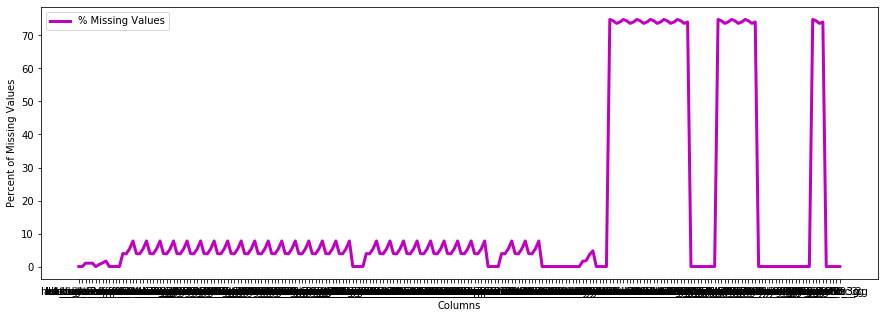

In [311]:
# Plot
plt.figure(figsize=(15,5))
plt.plot(Missing_Columns['Column'],Missing_Columns['Percent_Missing'],color='m',linewidth=3)
plt.xlabel('Columns')
plt.ylabel('Percent of Missing Values')
plt.legend(['% Missing Values'],loc='upper left')
plt.show()

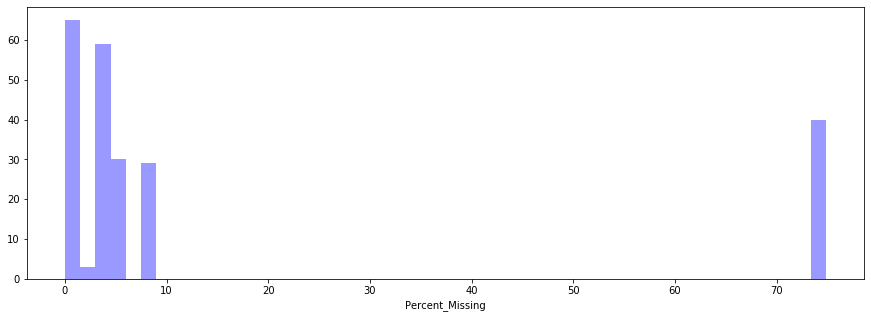

In [312]:
# PDF
plt.figure(figsize=(15,5))
sb.distplot(Missing_Columns['Percent_Missing'],color='b',bins=50,kde=False)
plt.show()

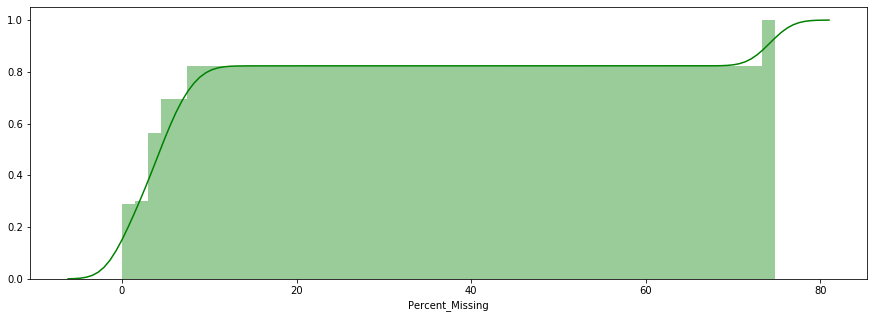

In [313]:
# CDF
plt.figure(figsize=(15,5))
sb.distplot(Missing_Columns['Percent_Missing'],color='g', kde_kws={'cumulative': True},hist_kws={'cumulative': True},bins=50)
plt.show()

#### Observations:

 - About 80% of Columns have less than 10% Missing Data i.e <b>~10,000 Data Points</b>.
 - About 10% of Columns have More Than 70% of Missing Data i.e <b> ~70,000 Data Points.

### Handling Missing Values

#### More Than 30% Missing Columns

In [314]:
# Columns With More Than 30% Missing Values

Missing_Columns[Missing_Columns['Percent_Missing']>30]

,Column,Number_Missing,Percent_Missing
157,date_of_last_rech_data_6,74846,74.846748
158,date_of_last_rech_data_7,74428,74.428744
159,date_of_last_rech_data_8,73660,73.660737
160,date_of_last_rech_data_9,74077,74.077741
161,total_rech_data_6,74846,74.846748
162,total_rech_data_7,74428,74.428744
163,total_rech_data_8,73660,73.660737
164,total_rech_data_9,74077,74.077741
165,max_rech_data_6,74846,74.846748
166,max_rech_data_7,74428,74.428744


#### Droping Down the Columns With Missing Values >30%

In [315]:
li=Missing_Columns['Column'][Missing_Columns['Percent_Missing']>30]
Data.drop(li, axis=1, inplace=True)

In [316]:
Data.shape

(99999, 186)

#### Remaining Missing Columns

In [317]:
# Columns With Less Than 30% Missing Values

Missing_Columns[(Missing_Columns['Percent_Missing']<30) & (Missing_Columns['Percent_Missing']>0)]

,Column,Number_Missing,Percent_Missing
2,loc_og_t2o_mou,1018,1.018010
3,std_og_t2o_mou,1018,1.018010
4,loc_ic_t2o_mou,1018,1.018010
6,last_date_of_month_7,601,0.601006
7,last_date_of_month_8,1100,1.100011
...,...,...,...
136,ic_others_9,7745,7.745077
149,date_of_last_rech_6,1607,1.607016
150,date_of_last_rech_7,1767,1.767018
151,date_of_last_rech_8,3622,3.622036


In [318]:
Data.head(2)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.2,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.0,0.0,0.0,0.0,0.0,2.91,0.0,0.0,35.39,150.51,299.54,72.11,0.23,4.11,0.0,0.0,0.0,0.46,0.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.0,0.0,0.0,0.0,0.0,40.31,178.53,312.44,72.1

#### Feature : _Outgoing Calls_


 
<center><b>total_og_mou = (loc_og_t2t_mou + loc_og_t2m_mou + loc_og_t2f_mou + loc_og_t2c_mou + std_og_t2t_mou + std_og_t2m_mou + std_og_t2f_mou + std_og_t2c_mou + isd_og_mou + spl_og_mou + og_others)</b></center>

 - We, do not have any Missing Values in _<b>total_og_mou</b>_ Column. So, all these Missing values can be handled using this column.

In [319]:
# Function To Handle Missing Values Related To Calls

def total_missing_handler(col,ref):
    l=list(Data['mobile_number'][Data[col].isnull()])
    print("Number of Missing Values : ",len(l))
    for i in l:
        if ((float(Data[ref][Data['mobile_number']==i]))==0.0):
            Data[col][Data['mobile_number']==i]=0
    al=list(Data['mobile_number'][Data[col].isnull()])
    print("Number of Missing Values After Handling : ",len(al))
    

In [320]:
print("June")
print("*"*80)
print("loc_og_t2t_mou")
total_missing_handler('loc_og_t2t_mou_6','total_og_mou_6')
print("="*60)
print("loc_og_t2f_mou")
total_missing_handler('loc_og_t2f_mou_6','total_og_mou_6')
print("="*60)
print("loc_og_t2m_mou")
total_missing_handler('loc_og_t2m_mou_6','total_og_mou_6')
print("="*60)
print("loc_og_t2c_mou")
total_missing_handler('loc_og_t2c_mou_6','total_og_mou_6')
print("="*60)
print("std_og_t2t_mou")
total_missing_handler('std_og_t2t_mou_6','total_og_mou_6')
print("="*60)
print("std_og_t2m_mou")
total_missing_handler('std_og_t2m_mou_6','total_og_mou_6')
print("="*60)
print("std_og_t2f_mou")
total_missing_handler('std_og_t2f_mou_6','total_og_mou_6')
print("="*60)
print("std_og_t2c_mou")
total_missing_handler('std_og_t2c_mou_6','total_og_mou_6')
print("="*60)
print("isd_og_mou ")
total_missing_handler('isd_og_mou_6','total_og_mou_6')
print("="*60)
print("spl_og_mou ")
total_missing_handler('spl_og_mou_6','total_og_mou_6')
print("="*60)
print("og_others ")
total_missing_handler('og_others_6','total_og_mou_6')
print("="*60)

June
********************************************************************************
loc_og_t2t_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
loc_og_t2f_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
loc_og_t2m_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
loc_og_t2c_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_og_t2t_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_og_t2m_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_og_t2f_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_og_t2c_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
isd_og_mou 
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
spl_og_mou 
Number of Missing Values :  3937
Number of Missing Values After Hand

In [321]:
print("July")
print("*"*80)
print("loc_og_t2t_mou")
total_missing_handler('loc_og_t2t_mou_7','total_og_mou_7')
print("="*60)
print("loc_og_t2f_mou")
total_missing_handler('loc_og_t2f_mou_7','total_og_mou_7')
print("="*60)
print("loc_og_t2m_mou")
total_missing_handler('loc_og_t2m_mou_7','total_og_mou_7')
print("="*60)
print("loc_og_t2c_mou")
total_missing_handler('loc_og_t2c_mou_7','total_og_mou_7')
print("="*60)
print("std_og_t2t_mou")
total_missing_handler('std_og_t2t_mou_7','total_og_mou_7')
print("="*60)
print("std_og_t2m_mou")
total_missing_handler('std_og_t2m_mou_7','total_og_mou_7')
print("="*60)
print("std_og_t2f_mou")
total_missing_handler('std_og_t2f_mou_7','total_og_mou_7')
print("="*60)
print("std_og_t2c_mou")
total_missing_handler('std_og_t2c_mou_7','total_og_mou_7')
print("="*60)
print("isd_og_mou ")
total_missing_handler('isd_og_mou_7','total_og_mou_7')
print("="*60)
print("spl_og_mou ")
total_missing_handler('spl_og_mou_7','total_og_mou_7')
print("="*60)
print("og_others ")
total_missing_handler('og_others_7','total_og_mou_7')
print("="*60)

July
********************************************************************************
loc_og_t2t_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
loc_og_t2f_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
loc_og_t2m_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
loc_og_t2c_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_og_t2t_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_og_t2m_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_og_t2f_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_og_t2c_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
isd_og_mou 
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
spl_og_mou 
Number of Missing Values :  3859
Number of Missing Values After Hand

In [322]:
print("August")
print("*"*80)
print("loc_og_t2t_mou")
total_missing_handler('loc_og_t2t_mou_8','total_og_mou_8')
print("="*60)
print("loc_og_t2f_mou")
total_missing_handler('loc_og_t2f_mou_8','total_og_mou_8')
print("="*60)
print("loc_og_t2m_mou")
total_missing_handler('loc_og_t2m_mou_8','total_og_mou_8')
print("="*60)
print("loc_og_t2c_mou")
total_missing_handler('loc_og_t2c_mou_8','total_og_mou_8')
print("="*60)
print("std_og_t2t_mou")
total_missing_handler('std_og_t2t_mou_8','total_og_mou_8')
print("="*60)
print("std_og_t2m_mou")
total_missing_handler('std_og_t2m_mou_8','total_og_mou_8')
print("="*60)
print("std_og_t2f_mou")
total_missing_handler('std_og_t2f_mou_8','total_og_mou_8')
print("="*60)
print("std_og_t2c_mou")
total_missing_handler('std_og_t2c_mou_8','total_og_mou_8')
print("="*60)
print("isd_og_mou ")
total_missing_handler('isd_og_mou_8','total_og_mou_8')
print("="*60)
print("spl_og_mou ")
total_missing_handler('spl_og_mou_8','total_og_mou_8')
print("="*60)
print("og_others ")
total_missing_handler('og_others_8','total_og_mou_8')
print("="*60)

August
********************************************************************************
loc_og_t2t_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
loc_og_t2f_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
loc_og_t2m_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
loc_og_t2c_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_og_t2t_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_og_t2m_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_og_t2f_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_og_t2c_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
isd_og_mou 
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
spl_og_mou 
Number of Missing Values :  5378
Number of Missing Values After Ha

In [323]:
print("September")
print("*"*80)
print("loc_og_t2t_mou")
total_missing_handler('loc_og_t2t_mou_9','total_og_mou_9')
print("="*60)
print("loc_og_t2f_mou")
total_missing_handler('loc_og_t2f_mou_9','total_og_mou_9')
print("="*60)
print("loc_og_t2m_mou")
total_missing_handler('loc_og_t2m_mou_9','total_og_mou_9')
print("="*60)
print("loc_og_t2c_mou")
total_missing_handler('loc_og_t2c_mou_9','total_og_mou_9')
print("="*60)
print("std_og_t2t_mou")
total_missing_handler('std_og_t2t_mou_9','total_og_mou_9')
print("="*60)
print("std_og_t2m_mou")
total_missing_handler('std_og_t2m_mou_9','total_og_mou_9')
print("="*60)
print("std_og_t2f_mou")
total_missing_handler('std_og_t2f_mou_9','total_og_mou_9')
print("="*60)
print("std_og_t2c_mou")
total_missing_handler('std_og_t2c_mou_9','total_og_mou_9')
print("="*60)
print("isd_og_mou ")
total_missing_handler('isd_og_mou_9','total_og_mou_9')
print("="*60)
print("spl_og_mou ")
total_missing_handler('spl_og_mou_9','total_og_mou_9')
print("="*60)
print("og_others ")
total_missing_handler('og_others_9','total_og_mou_9')
print("="*60)

September
********************************************************************************
loc_og_t2t_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
loc_og_t2f_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
loc_og_t2m_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
loc_og_t2c_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_og_t2t_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_og_t2m_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_og_t2f_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_og_t2c_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
isd_og_mou 
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
spl_og_mou 
Number of Missing Values :  7745
Number of Missing Values After

#### Minutes of Usage of Local Outgoing Calls


 
<center><b>loc_og_mou = (loc_og_t2t_mou + loc_og_t2m_mou + loc_og_t2f_mou + loc_og_t2c_mou)</b></center>

In [324]:
# Function To Handle Missing Values Related To Local Calls

def mou_handler(col,ref):
    l=list(Data['mobile_number'][Data[col].isnull()])
    print("Number of Missing Values : ",len(l))
    for i in l:
        Data[col][Data['mobile_number']==i]=Data[ref][Data['mobile_number']==i].sum(axis=1)
    al=list(Data['mobile_number'][Data[col].isnull()])
    print("Number of Missing Values After Handling : ",len(al))
    

In [325]:
print("loc_og_mou")
print("*"*60)
print("June")
mou_handler('loc_og_mou_6',['loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6','loc_og_t2c_mou_6'])
print("*"*60)
print("July")
mou_handler('loc_og_mou_7',['loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7','loc_og_t2c_mou_7'])
print("*"*60)
print("August")
mou_handler('loc_og_mou_8',['loc_og_t2t_mou_8','loc_og_t2m_mou_8','loc_og_t2f_mou_8','loc_og_t2c_mou_8'])
print("*"*60)
print("September")
mou_handler('loc_og_mou_9',['loc_og_t2t_mou_9','loc_og_t2m_mou_9','loc_og_t2f_mou_9','loc_og_t2c_mou_9'])

loc_og_mou
************************************************************
June
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
************************************************************
July
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
************************************************************
August
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
************************************************************
September
Number of Missing Values :  7745
Number of Missing Values After Handling :  0


#### Minutes of Usage of STD Outgoing Calls


 
<center><b>std_og_mou = (std_og_t2t_mou + std_og_t2m_mou + std_og_t2f_mou + std_og_t2c_mou)</b></center>

In [326]:
print("std_og_mou")
print("*"*60)
print("June")
mou_handler('std_og_mou_6',['std_og_t2t_mou_6','std_og_t2m_mou_6','std_og_t2f_mou_6','std_og_t2c_mou_6'])
print("*"*60)
print("July")
mou_handler('std_og_mou_7',['std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7','std_og_t2c_mou_7'])
print("*"*60)
print("August")
mou_handler('std_og_mou_8',['std_og_t2t_mou_8','std_og_t2m_mou_8','std_og_t2f_mou_8','std_og_t2c_mou_8'])
print("*"*60)
print("September")
mou_handler('std_og_mou_9',['std_og_t2t_mou_9','std_og_t2m_mou_9','std_og_t2f_mou_9','std_og_t2c_mou_9'])

std_og_mou
************************************************************
June
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
************************************************************
July
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
************************************************************
August
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
************************************************************
September
Number of Missing Values :  7745
Number of Missing Values After Handling :  0


#### Feature : _Incoming Calls_


 
<center><b>total_ic_mou = (loc_ic_t2t_mou + loc_ic_t2m_mou + loc_ic_t2f_mou + std_ic_t2t_mou + std_ic_t2m_mou + std_ic_t2f_mou + std_ic_t2o_mou + isd_ic_mou + spl_ic_mou + ic_others)</b></center>

 - We, do not have any Missing Values in _<b>total_ic_mou</b>_ Column. So, all these Missing values can be handled using this column.

In [327]:
print("June")
print("*"*80)
print("loc_ic_t2t_mou")
total_missing_handler('loc_ic_t2t_mou_6','total_ic_mou_6')
print("="*60)
print("loc_ic_t2f_mou")
total_missing_handler('loc_ic_t2f_mou_6','total_ic_mou_6')
print("="*60)
print("loc_ic_t2m_mou")
total_missing_handler('loc_ic_t2m_mou_6','total_ic_mou_6')
print("="*60)
print("std_ic_t2t_mou")
total_missing_handler('std_ic_t2t_mou_6','total_ic_mou_6')
print("="*60)
print("std_ic_t2m_mou")
total_missing_handler('std_ic_t2m_mou_6','total_ic_mou_6')
print("="*60)
print("std_ic_t2f_mou")
total_missing_handler('std_ic_t2f_mou_6','total_ic_mou_6')
print("="*60)
print("std_ic_t2o_mou")
total_missing_handler('std_ic_t2o_mou_6','total_ic_mou_6')
print("="*60)
print("isd_ic_mou ")
total_missing_handler('isd_ic_mou_6','total_ic_mou_6')
print("="*60)
print("spl_ic_mou ")
total_missing_handler('spl_ic_mou_6','total_ic_mou_6')
print("="*60)
print("ic_others ")
total_missing_handler('ic_others_6','total_ic_mou_6')
print("="*60)

June
********************************************************************************
loc_ic_t2t_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
loc_ic_t2f_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
loc_ic_t2m_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_ic_t2t_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_ic_t2m_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_ic_t2f_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
std_ic_t2o_mou
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
isd_ic_mou 
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
spl_ic_mou 
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
ic_others 
Number of Missing Values :  3937
Number of Missing Values After Handling

In [328]:
print("July")
print("*"*80)
print("loc_ic_t2t_mou")
total_missing_handler('loc_ic_t2t_mou_7','total_ic_mou_7')
print("="*60)
print("loc_ic_t2f_mou")
total_missing_handler('loc_ic_t2f_mou_7','total_ic_mou_7')
print("="*60)
print("loc_ic_t2m_mou")
total_missing_handler('loc_ic_t2m_mou_7','total_ic_mou_7')
print("="*60)
print("std_ic_t2t_mou")
total_missing_handler('std_ic_t2t_mou_7','total_ic_mou_7')
print("="*60)
print("std_ic_t2m_mou")
total_missing_handler('std_ic_t2m_mou_7','total_ic_mou_7')
print("="*60)
print("std_ic_t2f_mou")
total_missing_handler('std_ic_t2f_mou_7','total_ic_mou_7')
print("="*60)
print("std_ic_t2o_mou")
total_missing_handler('std_ic_t2o_mou_7','total_ic_mou_7')
print("="*60)
print("isd_ic_mou ")
total_missing_handler('isd_ic_mou_7','total_ic_mou_7')
print("="*60)
print("spl_ic_mou ")
total_missing_handler('spl_ic_mou_7','total_ic_mou_7')
print("="*60)
print("ic_others ")
total_missing_handler('ic_others_7','total_ic_mou_7')
print("="*60)

July
********************************************************************************
loc_ic_t2t_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
loc_ic_t2f_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
loc_ic_t2m_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_ic_t2t_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_ic_t2m_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_ic_t2f_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
std_ic_t2o_mou
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
isd_ic_mou 
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
spl_ic_mou 
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
ic_others 
Number of Missing Values :  3859
Number of Missing Values After Handling

In [329]:
print("August")
print("*"*80)
print("loc_ic_t2t_mou")
total_missing_handler('loc_ic_t2t_mou_8','total_ic_mou_8')
print("="*60)
print("loc_ic_t2f_mou")
total_missing_handler('loc_ic_t2f_mou_8','total_ic_mou_8')
print("="*60)
print("loc_ic_t2m_mou")
total_missing_handler('loc_ic_t2m_mou_8','total_ic_mou_8')
print("="*60)
print("std_ic_t2t_mou")
total_missing_handler('std_ic_t2t_mou_8','total_ic_mou_8')
print("="*60)
print("std_ic_t2m_mou")
total_missing_handler('std_ic_t2m_mou_8','total_ic_mou_8')
print("="*60)
print("std_ic_t2f_mou")
total_missing_handler('std_ic_t2f_mou_8','total_ic_mou_8')
print("="*60)
print("std_ic_t2o_mou")
total_missing_handler('std_ic_t2o_mou_8','total_ic_mou_8')
print("="*60)
print("isd_ic_mou ")
total_missing_handler('isd_ic_mou_8','total_ic_mou_8')
print("="*60)
print("spl_ic_mou ")
total_missing_handler('spl_ic_mou_8','total_ic_mou_8')
print("="*60)
print("ic_others ")
total_missing_handler('ic_others_8','total_ic_mou_8')
print("="*60)

August
********************************************************************************
loc_ic_t2t_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
loc_ic_t2f_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
loc_ic_t2m_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_ic_t2t_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_ic_t2m_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_ic_t2f_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
std_ic_t2o_mou
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
isd_ic_mou 
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
spl_ic_mou 
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
ic_others 
Number of Missing Values :  5378
Number of Missing Values After Handli

In [330]:
print("September")
print("*"*80)
print("loc_ic_t2t_mou")
total_missing_handler('loc_ic_t2t_mou_9','total_ic_mou_9')
print("="*60)
print("loc_ic_t2f_mou")
total_missing_handler('loc_ic_t2f_mou_9','total_ic_mou_9')
print("="*60)
print("loc_ic_t2m_mou")
total_missing_handler('loc_ic_t2m_mou_9','total_ic_mou_9')
print("="*60)
print("std_ic_t2t_mou")
total_missing_handler('std_ic_t2t_mou_9','total_ic_mou_9')
print("="*60)
print("std_ic_t2m_mou")
total_missing_handler('std_ic_t2m_mou_9','total_ic_mou_9')
print("="*60)
print("std_ic_t2f_mou")
total_missing_handler('std_ic_t2f_mou_9','total_ic_mou_9')
print("="*60)
print("std_ic_t2o_mou")
total_missing_handler('std_ic_t2o_mou_9','total_ic_mou_9')
print("="*60)
print("isd_ic_mou ")
total_missing_handler('isd_ic_mou_9','total_ic_mou_9')
print("="*60)
print("spl_ic_mou ")
total_missing_handler('spl_ic_mou_9','total_ic_mou_9')
print("="*60)
print("ic_others ")
total_missing_handler('ic_others_9','total_ic_mou_9')
print("="*60)

September
********************************************************************************
loc_ic_t2t_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
loc_ic_t2f_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
loc_ic_t2m_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_ic_t2t_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_ic_t2m_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_ic_t2f_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
std_ic_t2o_mou
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
isd_ic_mou 
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
spl_ic_mou 
Number of Missing Values :  7745
Number of Missing Values After Handling :  0
ic_others 
Number of Missing Values :  7745
Number of Missing Values After Han

#### Minutes of Usage of Local Incoming Calls


 
<center><b>loc_ic_mou = (loc_ic_t2t_mou + loc_ic_t2m_mou + loc_ic_t2f_mou )</b></center>

In [331]:
print("loc_ic_mou")
print("*"*60)
print("June")
mou_handler('loc_ic_mou_6',['loc_ic_t2t_mou_6','loc_ic_t2m_mou_6','loc_ic_t2f_mou_6'])
print("*"*60)
print("July")
mou_handler('loc_ic_mou_7',['loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7'])
print("*"*60)
print("August")
mou_handler('loc_ic_mou_8',['loc_ic_t2t_mou_8','loc_ic_t2m_mou_8','loc_ic_t2f_mou_8'])
print("*"*60)
print("September")
mou_handler('loc_ic_mou_9',['loc_ic_t2t_mou_9','loc_ic_t2m_mou_9','loc_ic_t2f_mou_9'])

loc_ic_mou
************************************************************
June
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
************************************************************
July
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
************************************************************
August
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
************************************************************
September
Number of Missing Values :  7745
Number of Missing Values After Handling :  0


#### Minutes of Usage of STD Incoming Calls


 
<center><b>std_ic_mou = (std_ic_t2t_mou + std_ic_t2m_mou + std_ic_t2f_mou + std_ic_t2o_mou )</b></center>

In [332]:
print("std_ic_mou")
print("*"*60)
print("June")
mou_handler('std_ic_mou_6',['std_ic_t2t_mou_6','std_ic_t2m_mou_6','std_ic_t2f_mou_6','std_ic_t2o_mou_6'])
print("*"*60)
print("July")
mou_handler('std_ic_mou_7',['std_ic_t2t_mou_7', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_7','std_ic_t2o_mou_7'])
print("*"*60)
print("August")
mou_handler('std_ic_mou_8',['std_ic_t2t_mou_8','std_ic_t2m_mou_8','std_ic_t2f_mou_8','std_ic_t2o_mou_8'])
print("*"*60)
print("September")
mou_handler('std_ic_mou_9',['std_ic_t2t_mou_9','std_ic_t2m_mou_9','std_ic_t2f_mou_9','std_ic_t2o_mou_9'])

std_ic_mou
************************************************************
June
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
************************************************************
July
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
************************************************************
August
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
************************************************************
September
Number of Missing Values :  7745
Number of Missing Values After Handling :  0


#### Minutes of Usage on Network

<center><b>onnet_mou = (loc_og_t2t_mou + loc_og_t2f_mou + loc_og_t2c_mou + std_og_t2t_mou + std_og_t2f_mou + std_og_t2c_mou) + (loc_ic_t2t_mou + loc_ic_t2f_mou + std_ic_t2t_mou + std_ic_t2f_mou )</b></center>

In [333]:
print("onnet_mou")
print("*"*60)
print("June")
mou_handler('onnet_mou_6',['loc_og_t2t_mou_6','loc_og_t2f_mou_6','loc_og_t2c_mou_6','std_og_t2t_mou_6','std_og_t2f_mou_6','std_og_t2c_mou_6','loc_ic_t2t_mou_6','loc_ic_t2f_mou_6','std_ic_t2t_mou_6','std_ic_t2f_mou_6' ])
print("*"*60)
print("July")
mou_handler('onnet_mou_7',['loc_og_t2t_mou_7','loc_og_t2f_mou_7','loc_og_t2c_mou_7','std_og_t2t_mou_7','std_og_t2f_mou_7','std_og_t2c_mou_7','loc_ic_t2t_mou_7','loc_ic_t2f_mou_7','std_ic_t2t_mou_7','std_ic_t2f_mou_7' ])
print("*"*60)
print("August")
mou_handler('onnet_mou_8',['loc_og_t2t_mou_8','loc_og_t2f_mou_8','loc_og_t2c_mou_8','std_og_t2t_mou_8','std_og_t2f_mou_8','std_og_t2c_mou_8','loc_ic_t2t_mou_8','loc_ic_t2f_mou_8','std_ic_t2t_mou_8','std_ic_t2f_mou_8' ])
print("*"*60)
print("September")
mou_handler('onnet_mou_9',['loc_og_t2t_mou_9','loc_og_t2f_mou_9','loc_og_t2c_mou_9','std_og_t2t_mou_9','std_og_t2f_mou_9','std_og_t2c_mou_9','loc_ic_t2t_mou_9','loc_ic_t2f_mou_9','std_ic_t2t_mou_9','std_ic_t2f_mou_9' ])

onnet_mou
************************************************************
June
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
************************************************************
July
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
************************************************************
August
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
************************************************************
September
Number of Missing Values :  7745
Number of Missing Values After Handling :  0


#### Minutes of Usage Off the Network

<center><b>offnet_mou=(loc_og_t2m_mou + std_og_t2m_mou + isd_og_mou + spl_og_mou + og_others) + (loc_ic_t2m_mou + std_ic_t2m_mou + std_ic_t2o_mou + isd_ic_mou + spl_ic_mou + ic_others)</b></center>

In [334]:
print("offnet_mou")
print("*"*60)
print("June")
mou_handler('offnet_mou_6',['loc_og_t2m_mou_6','std_og_t2m_mou_6','isd_og_mou_6','spl_og_mou_6','og_others_6','loc_ic_t2m_mou_6','std_ic_t2m_mou_6','std_ic_t2o_mou_6','isd_ic_mou_6','spl_ic_mou_6','ic_others_6' ])
print("*"*60)
print("July")
mou_handler('offnet_mou_7',['loc_og_t2m_mou_7','std_og_t2m_mou_7','isd_og_mou_7','spl_og_mou_7','og_others_7','loc_ic_t2m_mou_7','std_ic_t2m_mou_7','std_ic_t2o_mou_7','isd_ic_mou_7','spl_ic_mou_7','ic_others_7' ])
print("*"*60)
print("August")
mou_handler('offnet_mou_8',['loc_og_t2m_mou_8','std_og_t2m_mou_8','isd_og_mou_8','spl_og_mou_8','og_others_8','loc_ic_t2m_mou_8','std_ic_t2m_mou_8','std_ic_t2o_mou_8','isd_ic_mou_8','spl_ic_mou_8','ic_others_8' ])
print("*"*60)
print("September")
mou_handler('offnet_mou_9',['loc_og_t2m_mou_9','std_og_t2m_mou_9','isd_og_mou_9','spl_og_mou_9','og_others_9','loc_ic_t2m_mou_9','std_ic_t2m_mou_9','std_ic_t2o_mou_9','isd_ic_mou_9','spl_ic_mou_9','ic_others_9' ])

offnet_mou
************************************************************
June
Number of Missing Values :  3937
Number of Missing Values After Handling :  0
************************************************************
July
Number of Missing Values :  3859
Number of Missing Values After Handling :  0
************************************************************
August
Number of Missing Values :  5378
Number of Missing Values After Handling :  0
************************************************************
September
Number of Missing Values :  7745
Number of Missing Values After Handling :  0


#### roam_ic_mou

In [335]:
# Filling NaN Values with 0
Data["roam_ic_mou_6"].fillna(value=0, inplace=True)
Data["roam_ic_mou_7"].fillna(value=0, inplace=True)
Data["roam_ic_mou_8"].fillna(value=0, inplace=True)
Data["roam_ic_mou_9"].fillna(value=0, inplace=True)

#### roam_og_mou

In [336]:
# Filling NaN Values with 0
Data["roam_og_mou_6"].fillna(value=0, inplace=True)
Data["roam_og_mou_7"].fillna(value=0, inplace=True)
Data["roam_og_mou_8"].fillna(value=0, inplace=True)
Data["roam_og_mou_9"].fillna(value=0, inplace=True)

#### loc_og_t2o_mou, std_og_t2o_mou, loc_ic_t2o_mou

In [337]:
Data["loc_og_t2o_mou"].fillna(value=0, inplace=True)
Data["std_og_t2o_mou"].fillna(value=0, inplace=True)
Data["loc_ic_t2o_mou"].fillna(value=0, inplace=True)

In [338]:
Data.head(4)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0

#### Date Columns

In [340]:
# Converting to YYYY-MM-DD Format

Data['last_date_of_month_6'] = pd.to_datetime(Data['last_date_of_month_6'])
Data['last_date_of_month_7'] = pd.to_datetime(Data['last_date_of_month_7'])
Data['last_date_of_month_8'] = pd.to_datetime(Data['last_date_of_month_8'])
Data['last_date_of_month_9'] = pd.to_datetime(Data['last_date_of_month_9'])

Data['date_of_last_rech_6'] = pd.to_datetime(Data['date_of_last_rech_6'])
Data['date_of_last_rech_7'] = pd.to_datetime(Data['date_of_last_rech_7'])
Data['date_of_last_rech_8'] = pd.to_datetime(Data['date_of_last_rech_8'])
Data['date_of_last_rech_9'] = pd.to_datetime(Data['date_of_last_rech_9'])

In [358]:
import datetime
Data['Gap_Between_Recharge_1']=(Data['date_of_last_rech_7']-Data['date_of_last_rech_6'])
Data['Gap_Between_Recharge_2']=(Data['date_of_last_rech_8']-Data['date_of_last_rech_7'])

In [363]:
Data['Gap_Between_Recharge_1']=Data['Gap_Between_Recharge_1'].apply(lambda x:int(x.days))
Data['Gap_Between_Recharge_2']=Data['Gap_Between_Recharge_2'].apply(lambda x:int(x.days))

In [365]:
# Filling The Missing Values in Last Date of Month

Data["last_date_of_month_6"].fillna(value=30, inplace=True)
Data["last_date_of_month_7"].fillna(value=31, inplace=True)
Data["last_date_of_month_8"].fillna(value=31, inplace=True)
Data["last_date_of_month_9"].fillna(value=30, inplace=True)

In [362]:
# Filling The Missing Values In Date Columns With 150. For Feature Engineering.

Data['Gap_Between_Recharge_1'].fillna(value=80, inplace=True)
Data['Gap_Between_Recharge_2'].fillna(value=80, inplace=True)


In [366]:
Data.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9',"last_date_of_month_6","last_date_of_month_7","last_date_of_month_8","last_date_of_month_9"],axis=1,inplace=True)

In [367]:
Data.head(2)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Gap_Between_Recharge_1,Gap_Between_Recharge_2
0,7000842753,109,0.0,0.0,0.0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.0,0.00,1.15,0.0,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.2,3.58,25,23
1,7001865778,109,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.0,0.0,0.0,0.0,0.0,2.91,0.0,0.0,35.39,150.51,299.54,72.11,0.23,4.11,0.0,0.0,0.0,0.46,0.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.0,0.0,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.0,8.93,3.61,0.0,19.09,104.23,408.43,173.03,0.0,0.0,2.35,0.0,5.9,0.0,12.49,15.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.9,0.0,14.84,15.01,26.83,104.

In [368]:
print("Total Number of Columns With NULL Values : ",len(Data.columns[Data.isnull().any()]))

Total Number of Columns With NULL Values :  0


#### to_csv

In [369]:
Data.to_csv('Telecom_Missing_Values_Handled.csv')

### Customer Value Segmentation

Segmenting Customers by Value, the Standard Approach used is the  ‘<b>Decile Analysis</b>’. This Calculates a Value Measure for each Customer,  sorts the Customer Base into Descending Order by Value and then Splits the Base into 10 Equal Segments. The First or Top Decile is the Top  10 Percent of the Base. The Second Decile is the next 10 per cent, and  so on.

 - Depending on the Decile Analysis of the Revenue Being Generated by the Customers in the Months of June and July.
 - These are the Customer's, who contribute Maximum Revenue to the Company.
 - Identifying, the Customers with High Risk of Getting into Churn, can help the Company.

In [4]:
Data=pd.read_csv('Telecom_Missing_Values_Handled.csv')

In [8]:
Data.head(2)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Gap_Between_Recharge_1,Gap_Between_Recharge_2
0,7000842753,109,0.0,0.0,0.0,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.0,0.00,1.15,0.0,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.2,3.58,25,23
1,7001865778,109,0.0,0.0,0.0,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.0,0.0,0.0,0.0,0.0,2.91,0.0,0.0,35.39,150.51,299.54,72.11,0.23,4.11,0.0,0.0,0.0,0.46,0.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.0,0.0,0.0,0.0,0.0,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.0,8.93,3.61,0.0,19.09,104.23,408.43,173.03,0.0,0.0,2.35,0.0,5.9,0.0,12.49,15.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.9,0.0,14.84,15.01,26.83,104.

In [9]:
Data['Total_Revenue_6_7']=Data['total_rech_amt_6']+Data['total_rech_amt_7']

In [10]:
Data['Total_Revenue_6_7'].describe()

count    99999.000000
mean       650.477585
std        741.666932
min          0.000000
25%        230.000000
50%        458.000000
75%        838.000000
max      75525.000000
Name: Total_Revenue_6_7, dtype: float64

In [11]:
# Percentiles

from prettytable import PrettyTable

percentiles=PrettyTable()
percentiles.field_names=["Percentile","Value","Number of Customers","% of Customers"]

for i in range(10,-1,-1):
    p=np.percentile(Data['Total_Revenue_6_7'],(i*10))
    nc=Data[Data['Total_Revenue_6_7']>p].shape[0]
    per=(nc/Data.shape[0])*100
    percentiles.add_row([i,p,nc,"{:.2f}".format(per)])
print(percentiles)

+------------+---------+---------------------+----------------+
| Percentile |  Value  | Number of Customers | % of Customers |
+------------+---------+---------------------+----------------+
|     10     | 75525.0 |          0          |      0.00      |
|     9      |  1396.0 |         9987        |      9.99      |
|     8      |  970.0  |        19937        |     19.94      |
|     7      |  737.0  |        29979        |     29.98      |
|     6      |  575.0  |        39981        |     39.98      |
|     5      |  458.0  |        49924        |     49.92      |
|     4      |  356.0  |        59886        |     59.89      |
|     3      |  269.0  |        69958        |     69.96      |
|     2      |  199.0  |        79953        |     79.95      |
|     1      |  120.0  |        89073        |     89.07      |
|     0      |   0.0   |        96724        |     96.72      |
+------------+---------+---------------------+----------------+


In [12]:
Data['arpu_6_7']=Data['arpu_6']+Data['arpu_7']

In [13]:
Data['arpu_6_7'].describe()

count    99999.000000
mean       561.524007
std        620.356585
min      -1499.566000
25%        205.984500
50%        397.465000
75%        719.037000
max      62876.922000
Name: arpu_6_7, dtype: float64

In [14]:
# Percentiles

from prettytable import PrettyTable

percentiles=PrettyTable()
percentiles.field_names=["Percentile","Value","Number of Customers","% of Customers"]

for i in range(10,-1,-1):
    p=np.percentile(Data['arpu_6_7'],(i*10))
    nc=Data[Data['arpu_6_7']>p].shape[0]
    per=(nc/Data.shape[0])*100
    percentiles.add_row([i,p,nc,"{:.2f}".format(per)])
print(percentiles)

+------------+--------------------+---------------------+----------------+
| Percentile |       Value        | Number of Customers | % of Customers |
+------------+--------------------+---------------------+----------------+
|     10     | 62876.922000000006 |          0          |      0.00      |
|     9      | 1189.5655999999997 |        10000        |     10.00      |
|     8      | 829.7574000000004  |        20000        |     20.00      |
|     7      | 634.6185999999997  |        30000        |     30.00      |
|     6      | 499.12919999999997 |        40000        |     40.00      |
|     5      | 397.46500000000003 |        49999        |     50.00      |
|     4      | 311.0766000000001  |        59999        |     60.00      |
|     3      | 238.84340000000003 |        69999        |     70.00      |
|     2      |      173.631       |        79998        |     80.00      |
|     1      |      115.947       |        89999        |     90.00      |
|     0      |     -1499.

In [15]:
# Filtering The Data by Decile Analysis

HVD=Data[((Data['Total_Revenue_6_7']>737) | (Data['arpu_6_7']>634.6))]
HVD.reset_index(drop=True, inplace=True)
HVD.shape

(31670, 182)

In [16]:
l=list(HVD['mobile_number'][HVD['total_rech_amt_9']==0])
for i in l:
    HVD['total_rech_num_9'][HVD['mobile_number']==i]=0
    HVD['Gap_Between_Recharge_2'][HVD['mobile_number']==i]=80
    

### Labeling the Data

 - Assigning Churn Label To the Data, by Using September Month Data (As, mentioned in Problem Statement).
 - As, we have assigned the Churn Label based on September Month Data,we need to drop the column" and we need to Predict.
 - Depending on the _<b>total_ic_mou_, total_og_mou, vol_2g_mb, total_rech_num. i.e.</b>_ 
     - No Incoming and Outgoing Callls.
     - No Data Usage, either 2G or 3G.
     - No Recharges have been Done.

In [17]:
def fil_cond(HVD):
    if ((HVD['total_ic_mou_9'] <= 0) & (HVD['total_og_mou_9'] <= 0) & (HVD['vol_2g_mb_9'] <= 0) & (HVD['vol_3g_mb_9'] <= 0) & (HVD['total_rech_num_9']==0)):
        return 1
    else:
        return 0

In [18]:
HVD['Churn'] = HVD.apply(fil_cond, axis=1)
HVD['Churn'].value_counts()

0    29350
1     2320
Name: Churn, dtype: int64

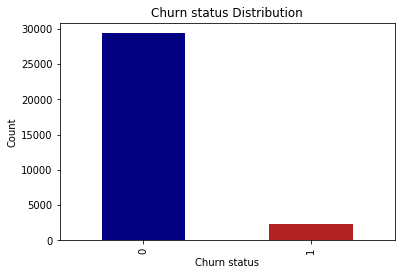

In [19]:
plt.figure(figsize=(6,4))
HVD['Churn'].value_counts().plot(kind = 'bar',color=('navy','firebrick'))
plt.ylabel('Count')
plt.xlabel('Churn status')
plt.title('Churn status Distribution')
plt.show()

In [20]:
print("Churn Rate : {:.3f} %".format((sum(HVD['Churn'])/len(HVD['Churn'].index))*100))

Churn Rate : 7.326 %


In [21]:
# Referred : https://stackoverflow.com/questions/19071199/drop-columns-whose-name-contains-a-specific-string-from-pandas-dataframe

HVD = HVD.drop(HVD.filter(regex='_9|sep', axis = 1).columns, axis=1)
print("Shape after Dropping Down the September Month Columns : ",HVD.shape)

Shape after Dropping Down the September Month Columns :  (31670, 140)


In [22]:
HVD.head(2)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Gap_Between_Recharge_1,Gap_Between_Recharge_2,Total_Revenue_6_7,arpu_6_7,Churn
0,7000701601,109,0.0,0.0,0.0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,28,80,2370,2419.030,1
1,7001524846,109,0.0,0.0,0.0,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.0,0.0,0.0,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,36,30,1038,870.944,0


## Exploratory Data Analysis

#### Columns With Single Unique Value

In [23]:
col_sing = pd.DataFrame(HVD.nunique()).reset_index().rename(columns = {'index': 'feature', 0: 'nunique'})
print("Number of Columns With 1 Value : ",len(col_sing[col_sing['nunique'] == 1]))

Number of Columns With 1 Value :  10


 - As, these Columns do not Infer anything, it's better to Drop these Columns.

In [24]:
HVD = HVD.drop(columns = list(col_sing[col_sing['nunique'] == 1]['feature']))
HVD.shape

(31670, 130)

In [25]:
HVD.head(2)

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Gap_Between_Recharge_1,Gap_Between_Recharge_2,Total_Revenue_6_7,arpu_6_7,Churn
0,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,28,80,2370,2419.030,1
1,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,36,30,1038,870.944,0


#### Feature : arpu

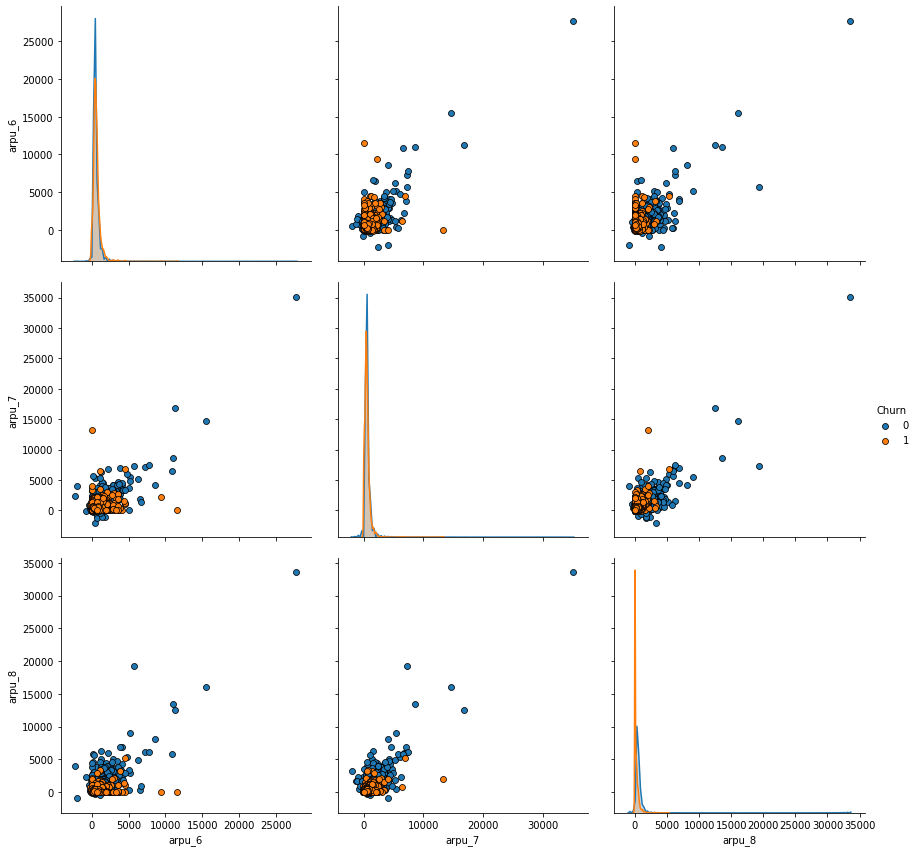

In [26]:
# Pair Plot 
sb.pairplot(HVD,vars=['arpu_6','arpu_7','arpu_8'],hue='Churn',plot_kws = {'edgecolor': 'k'},size = 4)
plt.show()

#### Feature : onnet_mou

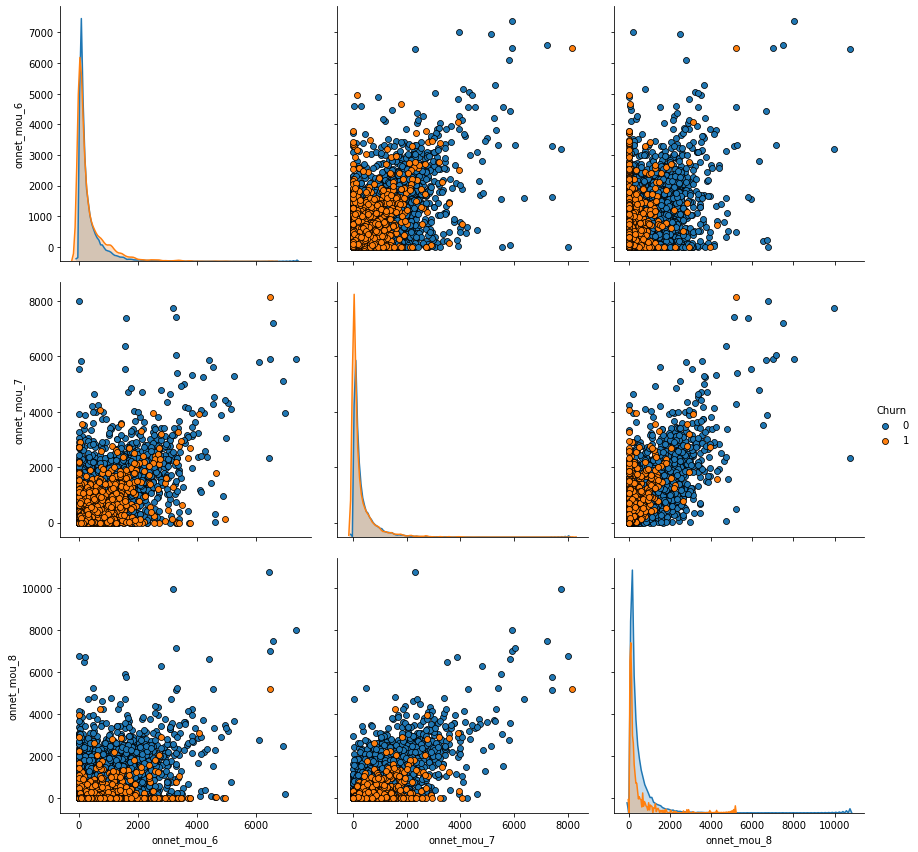

In [27]:
# Pair Plot 
sb.pairplot(HVD,vars=['onnet_mou_6','onnet_mou_7','onnet_mou_8'],hue='Churn',plot_kws = {'edgecolor': 'k'},size = 4)
plt.show()

#### Observations :
- No Inferences can be Inferred as Most of the Data is Overlapped

#### Feature : offnet_mou

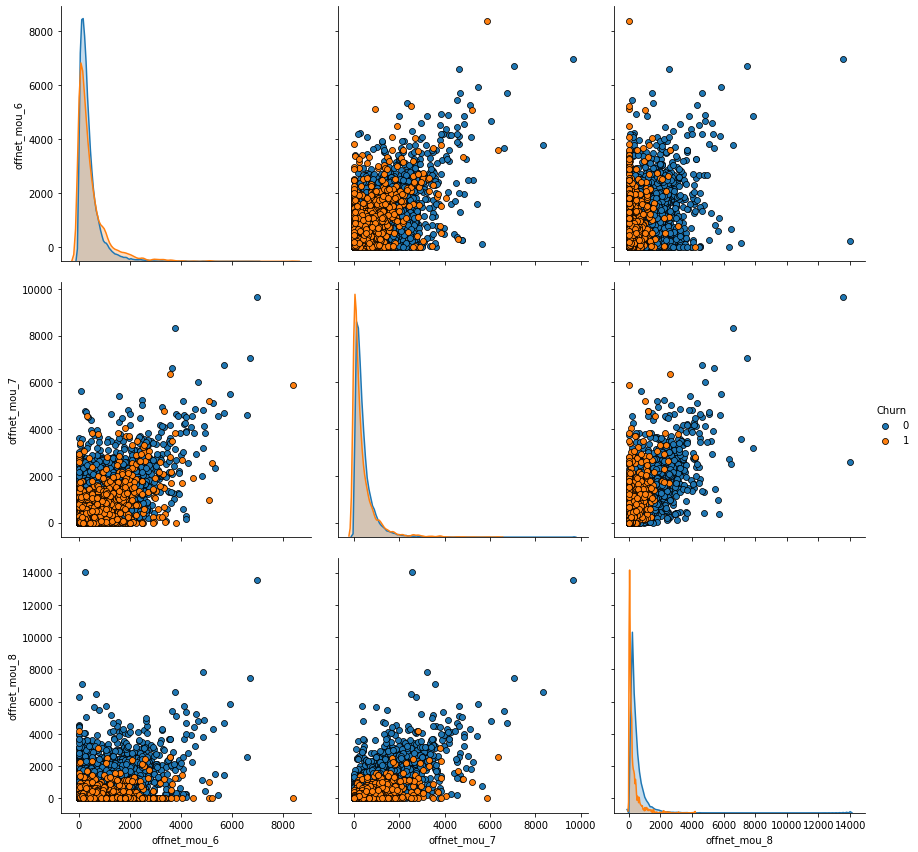

In [28]:
# Pair Plot 
sb.pairplot(HVD,vars=['offnet_mou_6','offnet_mou_7','offnet_mou_8'],hue='Churn',plot_kws = {'edgecolor': 'k'},size = 4)
plt.show()

#### Observations:

 - Most of the Data is Overlapped.
 - The Call Duration's made by the Churned Customer's to the Other Network's in the Month of <b>August</b> Decreased Drastically when Compared with the Previous Month's MOU and it's <b>Very Low</b>.
 - So, the Difference in usage of Minutes between Two Months may be an helpul Feature.

#### Feature : total_og_mou

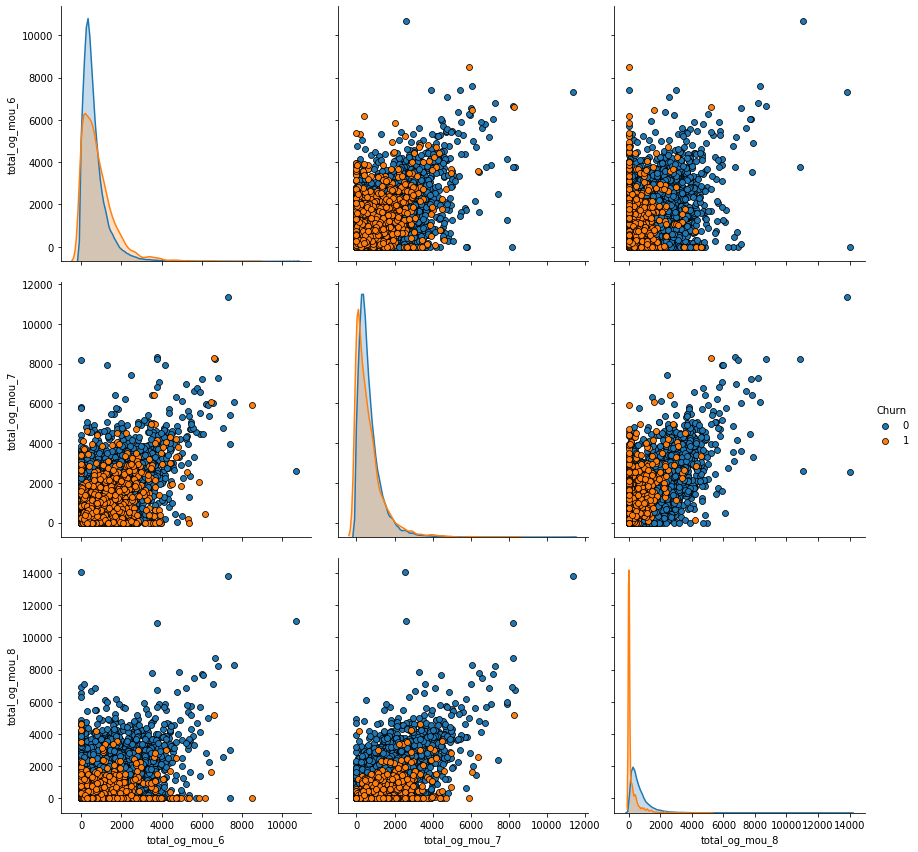

In [29]:
# Pair Plot 
sb.pairplot(HVD,vars=['total_og_mou_6','total_og_mou_7','total_og_mou_8'],hue='Churn',plot_kws = {'edgecolor': 'k'},size = 4)
plt.show()

#### Observations:

 - Most of the Data is Overlapped.
 - Outgoing MOU of Churned Customer's is <b>Very Low</b> in the Month of August.
 - So, the Difference in usage of Minutes between Two Months may be an helpul Feature.

#### Feature : total_ic_mou

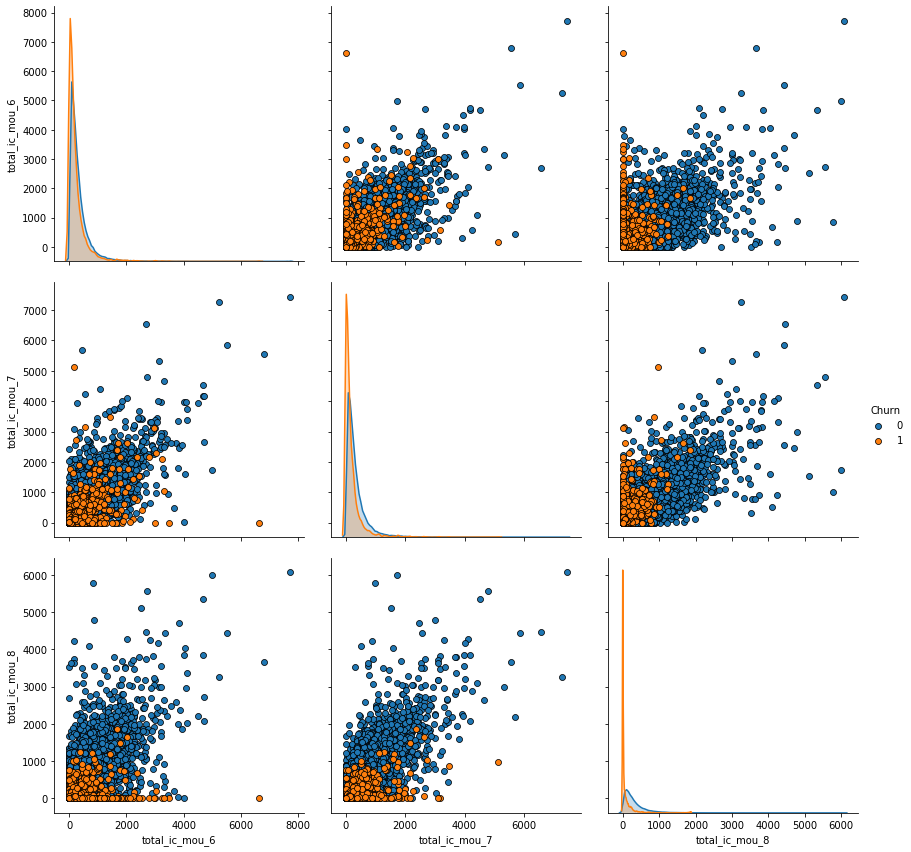

In [30]:
# Pair Plot 
sb.pairplot(HVD,vars=['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8'],hue='Churn',plot_kws = {'edgecolor': 'k'},size = 4)
plt.show()

#### Observations:

 - Most of the Data is Overlapped.
 - Incoming Call MOU for Chuned Customer's is <b>Very Low</b> and it's very low in the month of August .
 - So, the Difference in usage of Minutes between Two Months may be an helpul Feature.

#### Feature : total_rech_num

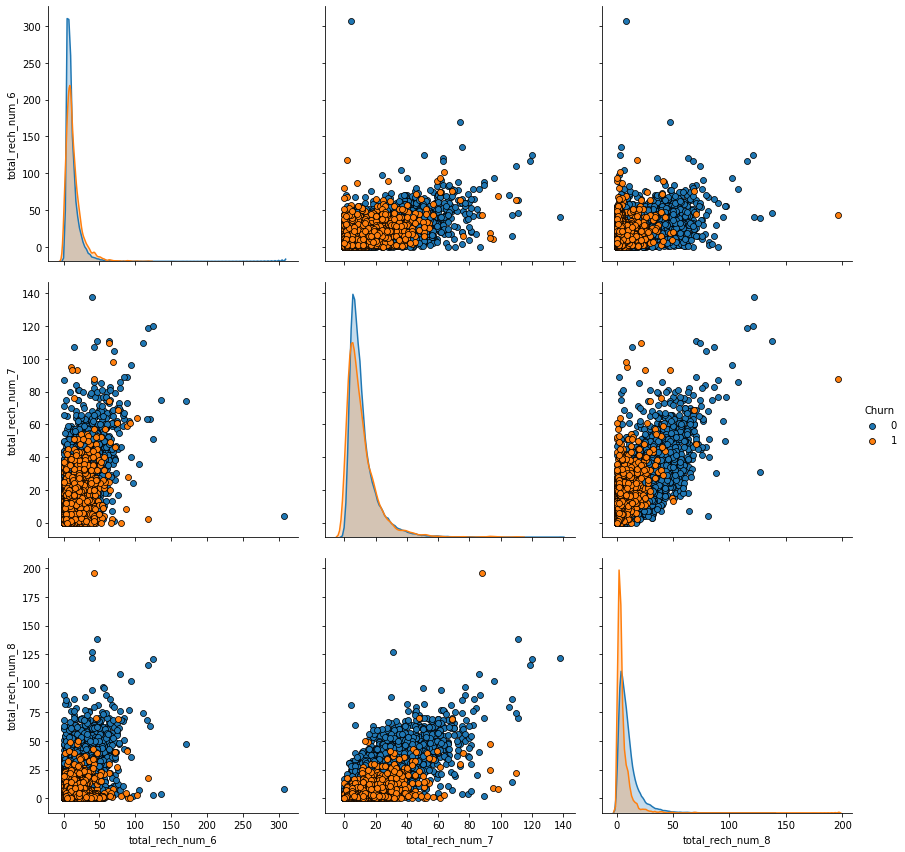

In [34]:
# Pair Plot 
sb.pairplot(HVD,vars=['total_rech_num_6','total_rech_num_7','total_rech_num_8'],hue='Churn',plot_kws = {'edgecolor': 'k'},size = 4)
plt.show()

#### Observations:

 - Most of the Data is Overlapped.
 - Higher the Number of Recharges, lesser the Churn Rate.

#### Feature : vol_2g_mb,vol_3g_mb

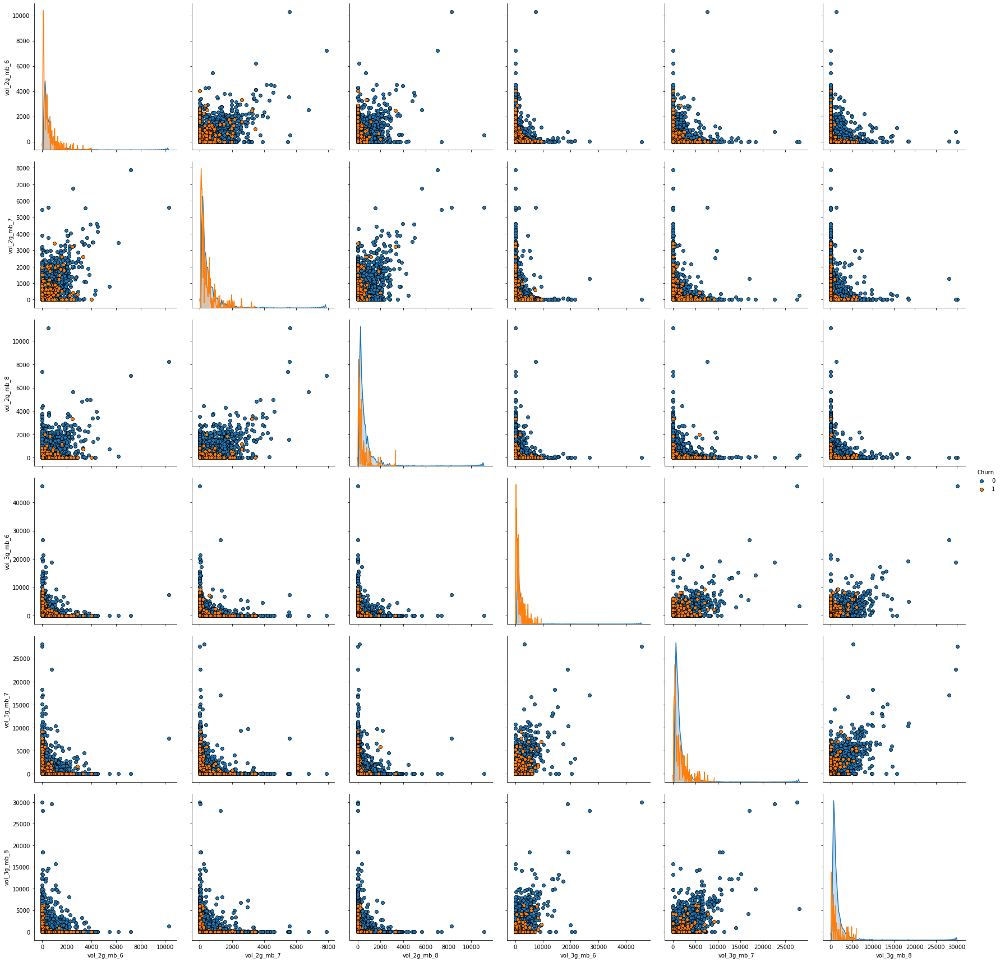

In [35]:
# Pair Plot 
sb.pairplot(HVD,vars=['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8'],hue='Churn',plot_kws = {'edgecolor': 'k'},size = 4)
plt.show()

#### Observations:

 - Most of the Data is Overlapped.
 - For Churned Customer's, Data Usage Has been Decreased when compared with Previous Months Usage. 

#### Feature : aon

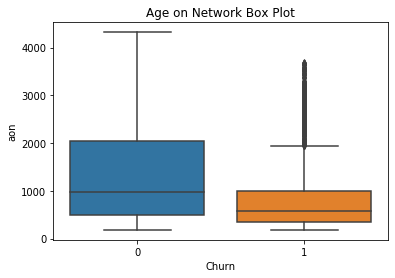

In [36]:
sb.boxplot(data=HVD,x='Churn',y='aon')
plt.title('Age on Network Box Plot')
plt.show()

#### Observations:

 - As the Age on Network is High the Churn Rate is Low.
 - Churn Rate is Lower if Age on Network is above 1000.

#### Feature : Gap_Between_Recharge

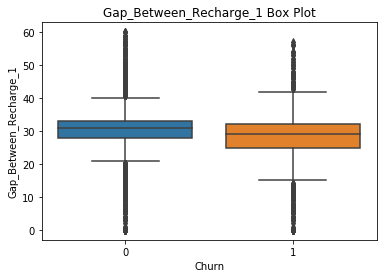

In [37]:
sb.boxplot(data=HVD,x='Churn',y='Gap_Between_Recharge_1')
plt.title('Gap_Between_Recharge_1 Box Plot')
plt.show()

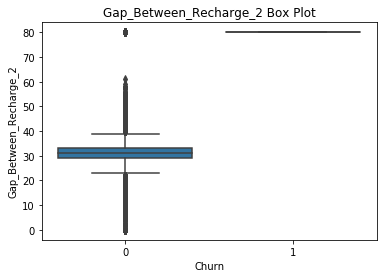

In [38]:
sb.boxplot(data=HVD,x='Churn',y='Gap_Between_Recharge_2')
plt.title('Gap_Between_Recharge_2 Box Plot')
plt.show()

#### Observations:

 - 80 is the Value filled, if there are no Recharges Done.
 - So, Most of the Churned Customer's haven't done Recharge in the Month of August.

### Deriving Features

Obtaining Features Based on the above Analysis and Domain Knowledge.

#### Difference in Outgoing MOU

In [39]:
HVD['og_7_8_d']=HVD['total_og_mou_8']-HVD['total_og_mou_7']

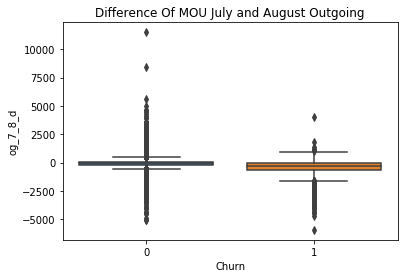

In [40]:
sb.boxplot(data=HVD,x='Churn',y='og_7_8_d')
plt.title('Difference Of MOU July and August Outgoing')
plt.show()

In [41]:
HVD['loc_og_t2m_1']=HVD['loc_og_t2m_mou_7']-HVD['loc_og_t2m_mou_8']
HVD['loc_og_1']=HVD['loc_og_mou_7']-HVD['loc_og_mou_8']
HVD['std_og_1']=HVD['std_og_mou_7']-HVD['std_og_mou_8']

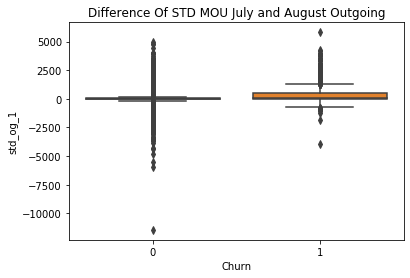

In [42]:
sb.boxplot(data=HVD,x='Churn',y='std_og_1')
plt.title('Difference Of STD MOU July and August Outgoing')
plt.show()

#### Difference in Incoming MOU

In [43]:
HVD['ic_7_8_d']=HVD['total_ic_mou_8']-HVD['total_ic_mou_7']

#### Average Incoming MOU

In [44]:
HVD['ic_avg']=(HVD['total_ic_mou_6']+HVD['total_ic_mou_7']+HVD['total_ic_mou_8'])/3

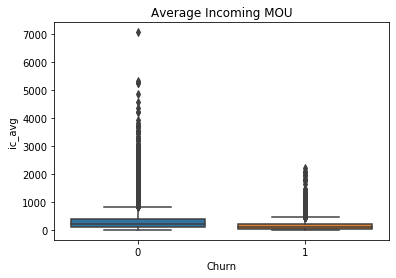

In [45]:
sb.boxplot(data=HVD,x='Churn',y='ic_avg')
plt.title('Average Incoming MOU')
plt.show()

#### Average Outgoing MOU

In [46]:
HVD['og_avg']=(HVD['total_og_mou_6']+HVD['total_og_mou_7']+HVD['total_og_mou_8'])/3

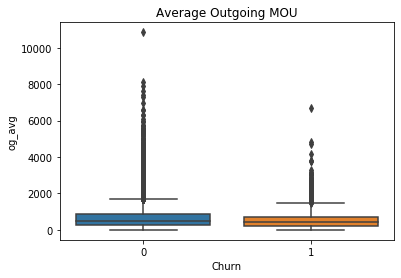

In [47]:
sb.boxplot(data=HVD,x='Churn',y='og_avg')
plt.title('Average Outgoing MOU')
plt.show()

#### Average ARPU

In [48]:
HVD['arpu_avg']=(HVD['arpu_6']+HVD['arpu_7']+HVD['arpu_8'])/3

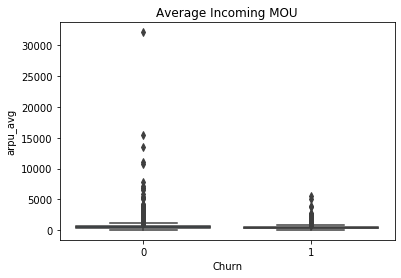

In [49]:
sb.boxplot(data=HVD,x='Churn',y='arpu_avg')
plt.title('Average Incoming MOU')
plt.show()

#### Average Onnet MOU

In [50]:
HVD['onnet_avg']=(HVD['onnet_mou_6']+HVD['onnet_mou_7']+HVD['onnet_mou_8'])/3

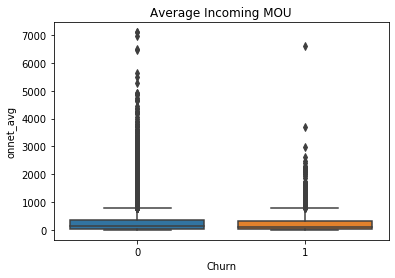

In [51]:
sb.boxplot(data=HVD,x='Churn',y='onnet_avg')
plt.title('Average Incoming MOU')
plt.show()

#### Average Offnet MOU

In [52]:
HVD['offnet_avg']=(HVD['offnet_mou_6']+HVD['offnet_mou_7']+HVD['offnet_mou_8'])/3

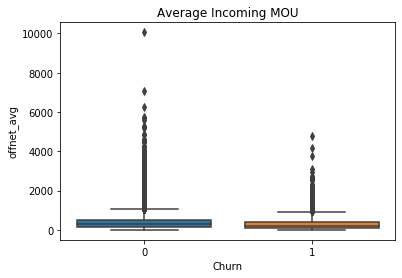

In [53]:
sb.boxplot(data=HVD,x='Churn',y='offnet_avg')
plt.title('Average Incoming MOU')
plt.show()

#### Average VBC

In [54]:
HVD['vbc_avg']=(HVD['aug_vbc_3g']+HVD['jul_vbc_3g']+HVD['jun_vbc_3g'])/3

#### Difference in Total Revenue

In [55]:
HVD['Total_Revenue_7_8']=HVD['total_rech_amt_7']+HVD['total_rech_amt_8']
HVD['Revenue_Change']=HVD['Total_Revenue_7_8']-HVD['Total_Revenue_6_7']

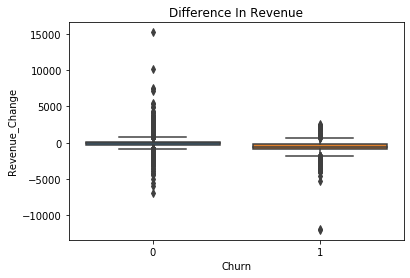

In [56]:
sb.boxplot(data=HVD,x='Churn',y='Revenue_Change')
plt.title('Difference In Revenue')
plt.show()

In [57]:
HVD.head(2)

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Gap_Between_Recharge_1,Gap_Between_Recharge_2,Total_Revenue_6_7,arpu_6_7,Churn,og_7_8_d,loc_og_t2m_1,loc_og_1,std_og_1,ic_7_8_d,ic_avg,og_avg,arpu_avg,onnet_avg,offnet_avg,vbc_avg,Total_Revenue_7_8,Revenue_Change
0,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,28,80,2370,2419.030,1,-259.08,285.10,278.12,-2.7,-129.30,537.746667,482.310000,1863.503333,54.936667,448.833333,31.953333,4428,2058
1,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,36,30,1038,870.944,0,-260.10,20.04,225.14,45.2,-11.95,49.630000,370.526667,336.102000,266.600000,103.923333,351.280000,721,-317


In [169]:
HVD.to_csv("telecom_churn_data1.csv")

### Correlation Between the Columns

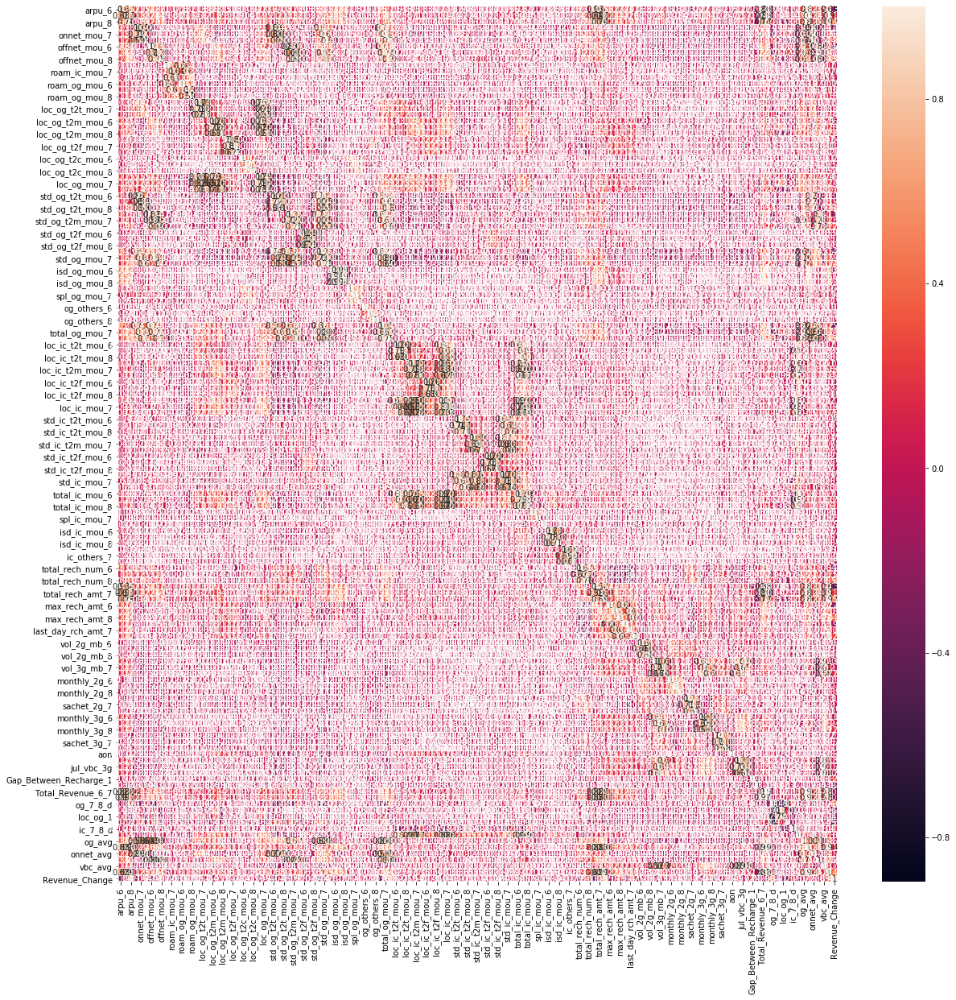

In [58]:
# Referred : https://heartbeat.fritz.ai/seaborn-heatmaps-13-ways-to-customize-correlation-matrix-visualizations-f1c49c816f07
THVD=HVD.drop(['mobile_number', 'Churn'], axis=1)
plt.figure(figsize=(20,20))
sb.heatmap(THVD.corr(),annot = True)
plt.show()

In [59]:
# Referred : https://chrisalbon.com/machine_learning/feature_selection/drop_highly_correlated_features/
# Create correlation matrix
corr_matrix = THVD.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.50
high_corr_features = [column for column in upper.columns if any(upper[column] > 0.50)]

print("Number of Features Correlated with > 0.5 : {}".format(len(high_corr_features)))

Number of Features Correlated with > 0.5 : 102


#### Observation:
 - Most of Features are Highly Correlated.
 - So, We need to Perform Dimensionaly Reduction.

## Splitting The Data

In [60]:
X=HVD.drop(['mobile_number','Churn'],axis=1)
Y=HVD['Churn']

In [61]:
# Splitting the Data in 70:30

from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.3,random_state=42)
print("X_train.shape : ",X_train.shape)
print("Y_train.shape : ",Y_train.shape)
print("X_test.shape : ",X_test.shape)
print("Y_test.shape : ",Y_test.shape)

X_train.shape :  (22169, 141)
Y_train.shape :  (22169,)
X_test.shape :  (9501, 141)
Y_test.shape :  (9501,)


### Standardizing The Data

In [62]:
from sklearn.preprocessing import StandardScaler

Standardizer = StandardScaler()
X_Train_std=Standardizer.fit_transform(X_train.values)
X_Test_std=Standardizer.transform(X_test.values)

In [158]:
from pickle import dump

dump(Standardizer, open('Scaler.pkl', 'wb'))

In [63]:
print(Y_train.value_counts())

0    20539
1     1630
Name: Churn, dtype: int64


 - As, the data is Highly Imbalanced, we need to Oversample the Data.

### Upsampling

By Using SMOTE
 - Creates Synthetic Artificial New Datapoints.

In [64]:
# Referred : https://imbalanced-learn.readthedocs.io/en/stable/auto_examples/over-sampling/plot_comparison_over_sampling.html
# Referred : https://www.quora.com/Whats-the-difference-between-random-oversampling-and-oversampling-using-SMOTE-on-an-imbalanced-dataset-Is-the-later-always-better-then-the-first

from imblearn.over_sampling import SMOTE

upsampler = SMOTE() 
X_Train,Y_Train = upsampler.fit_sample(X_Train_std,Y_train)

In [65]:
print("Shape After Applying SMOTE : ")
print("X_Train.shape : ",X_Train.shape)
print("Y_Train.shape : ",Y_Train.shape)

Shape After Applying SMOTE : 
X_Train.shape :  (41078, 141)
Y_Train.shape :  (41078,)


In [66]:
print(Y_Train.value_counts())

1    20539
0    20539
Name: Churn, dtype: int64


### Model Building

#### Functions

In [68]:
# Referred : https://stackoverflow.com/questions/18380168/center-output-plots-in-the-notebook
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [88]:
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    A =(((C.T)/(C.sum(axis=1))).T)
    B =(C/C.sum(axis=0))
    plt.figure(figsize=(20,4))    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sb.light_palette("navy")
    
    plt.subplot(1, 3, 1)
    sb.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sb.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sb.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

In [116]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import f1_score

def analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred):
    
    # Finding FPR,TPR,Threshold
   
    Train_fpr,Train_tpr,Train_Thresholds=roc_curve(Y_Train,Y_train_pred)
    Test_fpr,Test_tpr,Test_Thresholds=roc_curve(Y_test,Y_test_pred)
   
    # Plotting ROC Curve

    print("**********************************************************************************************************************")

    plt.figure(figsize=(8,4))
    plt.plot(Train_fpr,Train_tpr,label='Train AUC: {0:.3f}'.format(roc_auc_score(Y_Train,Y_train_pred)),color='darkgreen',lw=1.5)
    plt.plot(Test_fpr,Test_tpr,label='Test AUC: {0:.3f}'.format(roc_auc_score(Y_test,Y_test_pred)),color='maroon',lw=1.5)
    plt.legend(fontsize=12) 
    plt.xlabel('FPR') 
    plt.ylabel('TPR') 
    plt.title("ROC Curve")
    plt.grid() 
    plt.show()

    print("*********************************************************************************************************************\n")
    #Score
    
    print("Train AUC : ",roc_auc_score(Y_Train,Y_train_pred))
    print("Test AUC : ",roc_auc_score(Y_test,Y_test_pred))
    print("F1 Score : ",f1_score(Y_test, Y_test_pred,average='micro'))

    print("\n**********************************************************************************************************************")
    plot_confusion_matrix(Y_test, Y_test_pred)

### KNN

**********************************************************************************************************************


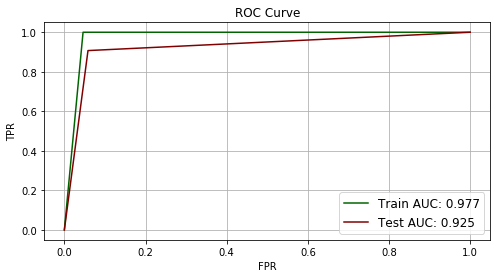

*********************************************************************************************************************

Train AUC :  0.9769462972880861
Test AUC :  0.9245118503056949
F1 Score :  0.9392695505736238

**********************************************************************************************************************


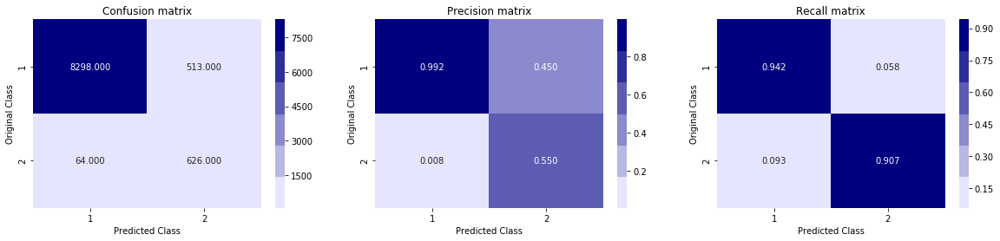

In [120]:
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier()
KNNF = KNN.fit(X_Train,Y_Train)

Y_train_pred=KNNF.predict(X_Train)
Y_test_pred=KNNF.predict(X_Test_std)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

**********************************************************************************************************************


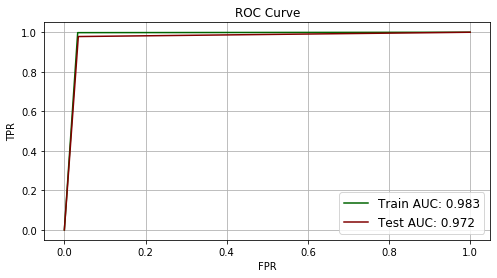

*********************************************************************************************************************

Train AUC :  0.9825454014314232
Test AUC :  0.9719360187117881
F1 Score :  0.9665298389643195

**********************************************************************************************************************


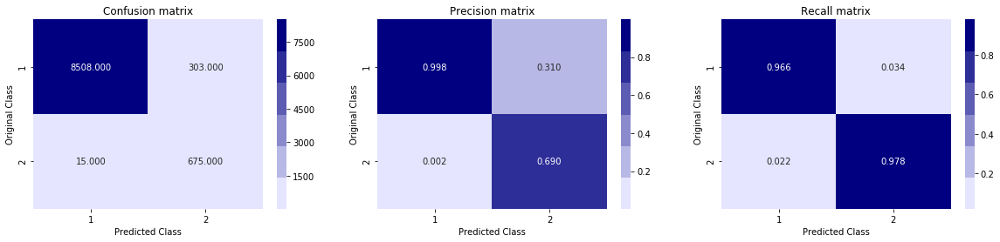

In [121]:
from sklearn.linear_model import LogisticRegression

LRS = LogisticRegression()
LRSF = LRS.fit(X_Train,Y_Train)

Y_train_pred=LRSF.predict(X_Train)
Y_test_pred=LRSF.predict(X_Test_std)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Random Forest

**********************************************************************************************************************


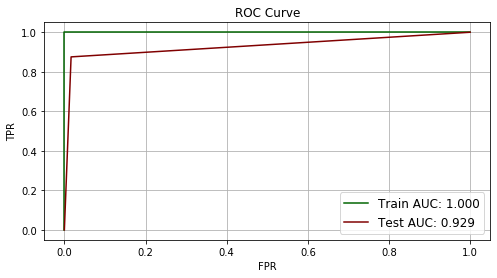

*********************************************************************************************************************

Train AUC :  1.0
Test AUC :  0.9293960612475513
F1 Score :  0.9755815177349753

**********************************************************************************************************************


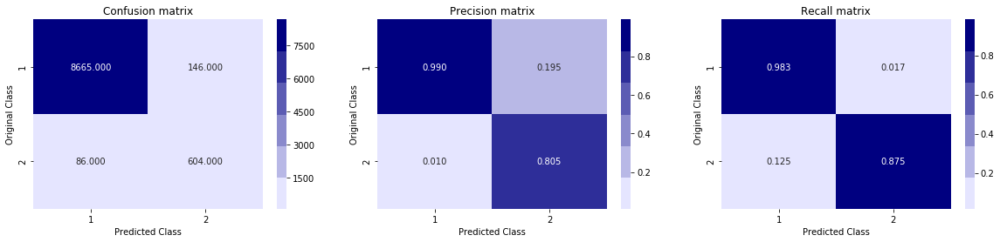

In [122]:
from sklearn.ensemble import RandomForestClassifier

RF=RandomForestClassifier()
RFG=RF.fit(X_Train,Y_Train)

Y_train_pred=RFG.predict(X_Train)
Y_test_pred=RFG.predict(X_Test_std)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### XGBoost

**********************************************************************************************************************


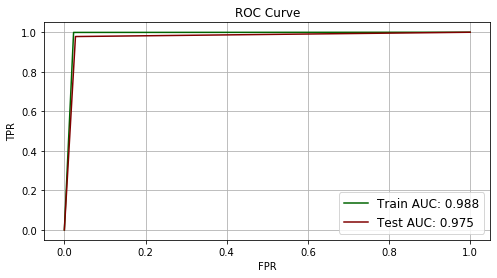

*********************************************************************************************************************

Train AUC :  0.9881688495058182
Test AUC :  0.9754543480728141
F1 Score :  0.9730554678454899

**********************************************************************************************************************


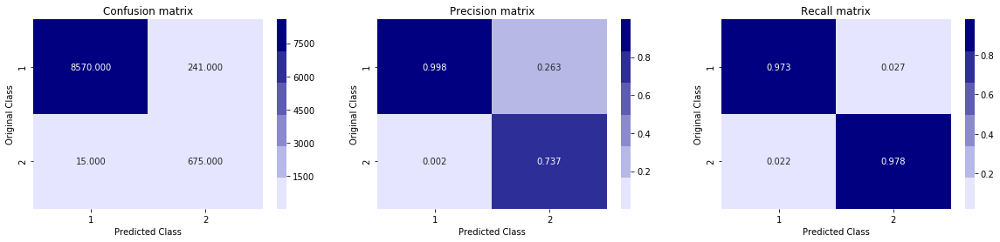

In [123]:
import xgboost as xgb

GBDT=xgb.XGBClassifier()
GBDTG=GBDT.fit(X_Train,Y_Train)

Y_train_pred=GBDTG.predict(X_Train)
Y_test_pred=GBDTG.predict(X_Test_std)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Hyper Parameter Tuning

### Logistic Regression

In [124]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

parameter={'C' :[10 ** x for x in range(-5, 4)]}

LR=LogisticRegression(penalty='l2')
LRG=GridSearchCV(LR,parameter,cv=4,scoring='roc_auc',return_train_score=True)
LRG.fit(X_Train,Y_Train)

results=pd.DataFrame.from_dict(LRG.cv_results_)
Best_C=LRG.best_params_['C']
Best_Score=LRG.best_score_

In [125]:
result=results.sort_values(['param_C'])
gscv_train_auc=results['mean_train_score']
gscv_CV_auc=results['mean_test_score']

In [126]:
from tqdm import tqdm_notebook as tqdm
C=[10 ** x for x in range(-5, 4)]
log_C=[]
for x in tqdm(C):
    log_C.append(np.log(x))

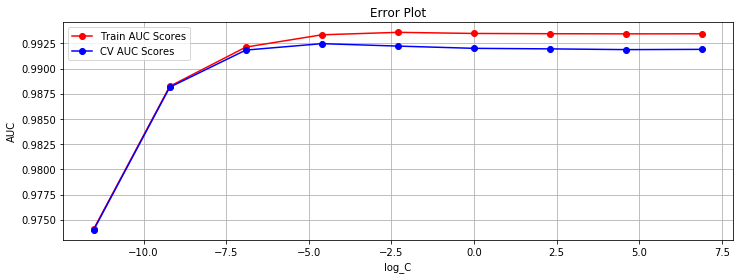

In [127]:
plt.figure(figsize=(12,4))
plt.plot(log_C,gscv_train_auc,label='Train AUC Scores',linestyle='-',marker='o',color='r')
plt.plot(log_C,gscv_CV_auc,label='CV AUC Scores',linestyle='-',marker='o',color='b')
plt.legend()
plt.xlabel('log_C')
plt.ylabel('AUC')
plt.title('Error Plot')
plt.grid()
plt.show()

In [128]:
print("Best C : ",Best_C)
print("Best Score : ",Best_Score)

Best C :  0.01
Best Score :  0.9924663882601291


#### Testing the Model With the Best Obtained Hyperparameter 'C'

**********************************************************************************************************************


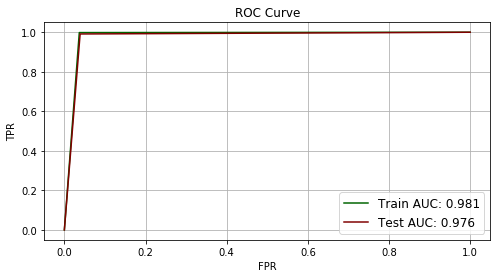

*********************************************************************************************************************

Train AUC :  0.980743950533132
Test AUC :  0.976244615179642
F1 Score :  0.9633722766024628

**********************************************************************************************************************


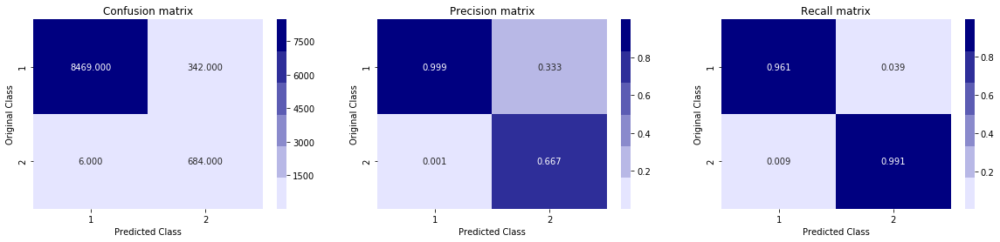

In [129]:
from sklearn.metrics import roc_curve
Best_LR=LogisticRegression(C=Best_C,n_jobs=-1)
Best_LR.fit(X_Train,Y_Train)

Y_train_pred=Best_LR.predict(X_Train)
Y_test_pred=Best_LR.predict(X_Test_std)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Dimensionality Reduction

#### Applying PCA

In [130]:
from sklearn.decomposition import PCA

PCA_I = PCA(random_state=42)
PCA_I.fit(X_Train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

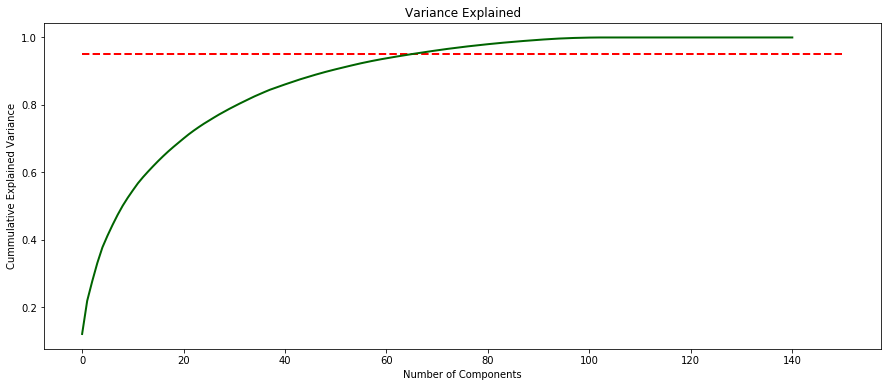

In [131]:
# Plot of Variance Explained

fig = plt.figure(figsize = (15,6))
plt.plot(np.cumsum(PCA_I.explained_variance_ratio_),color='darkgreen',linewidth=2)
plt.hlines(y=0.95, xmin=0, xmax=len(np.linspace(0, 150, 150)), colors='r', linestyles='--', linewidth=2)
plt.xlabel('Number of Components')
plt.ylabel('Cummulative Explained Variance')
plt.title('Variance Explained')
plt.show()

In [132]:
np.sum(np.cumsum(np.round(PCA_I.explained_variance_ratio_, decimals=4)*100)<=95)

65

#### Observation:
 - 95% Variance Explained by 65 Features.

#### Applying PCA with n_components = 65

In [133]:
PCA_In = PCA(n_components=65)
X_Train_pca=PCA_In.fit_transform(X_Train)
X_Test_pca=PCA_In.transform(X_Test_std)

In [159]:
dump(PCA_In, open('PCA_65.pkl', 'wb'))

#### Correlation After Applying PCA

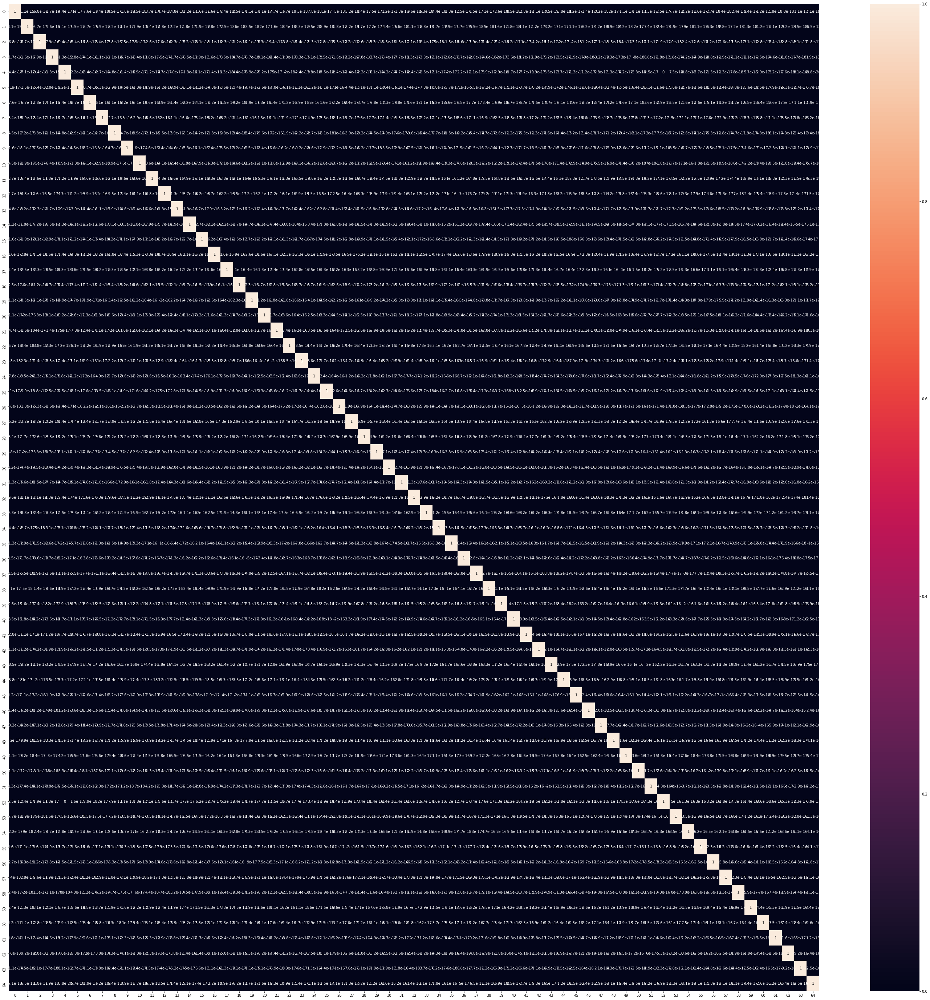

In [134]:
plt.figure(figsize=(50,50))
sb.heatmap(np.corrcoef(X_Train_pca.transpose()),annot = True)
plt.show()

## Models

### Simple Models With Default Parameters

### KNN

**********************************************************************************************************************


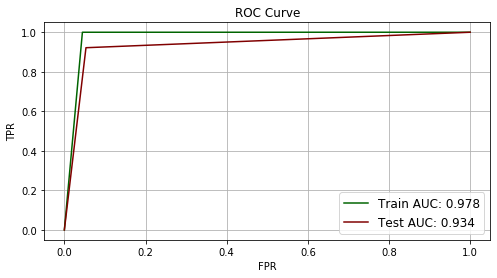

*********************************************************************************************************************

Train AUC :  0.9777496470129997
Test AUC :  0.9342551060186625
F1 Score :  0.9449531628249658

**********************************************************************************************************************


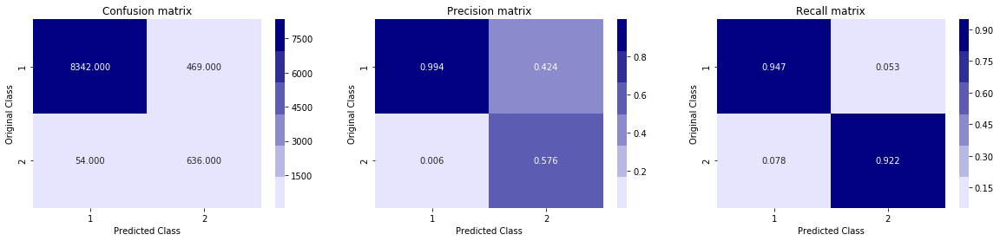

In [135]:
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier()
KNNF = KNN.fit(X_Train_pca,Y_Train)

Y_train_pred=KNNF.predict(X_Train_pca)
Y_test_pred=KNNF.predict(X_Test_pca)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Logistic Regression

**********************************************************************************************************************


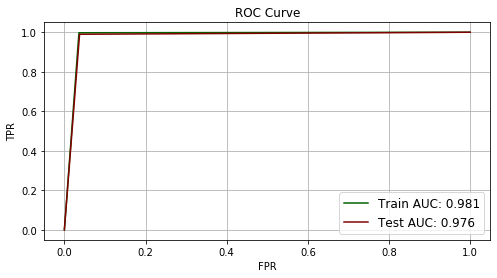

*********************************************************************************************************************

Train AUC :  0.980743950533132
Test AUC :  0.9762009444715845
F1 Score :  0.964530049468477

**********************************************************************************************************************


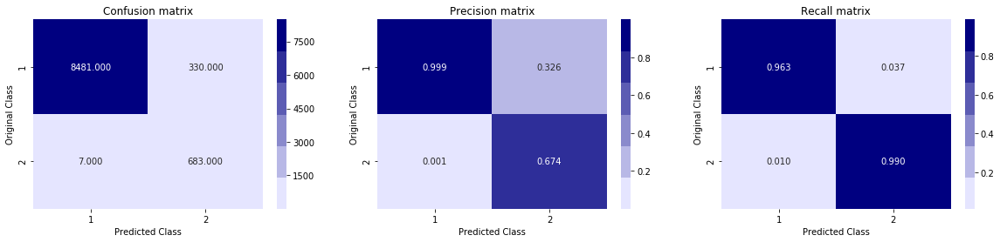

In [136]:
from sklearn.linear_model import LogisticRegression

LRS = LogisticRegression()
LRSF = LRS.fit(X_Train_pca,Y_Train)

Y_train_pred=LRSF.predict(X_Train_pca)
Y_test_pred=LRSF.predict(X_Test_pca)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Random Forest

**********************************************************************************************************************


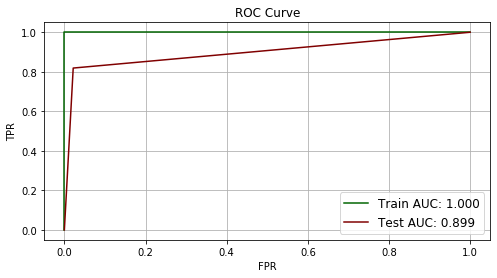

*********************************************************************************************************************

Train AUC :  1.0
Test AUC :  0.8985248182854436
F1 Score :  0.9666350910430481

**********************************************************************************************************************


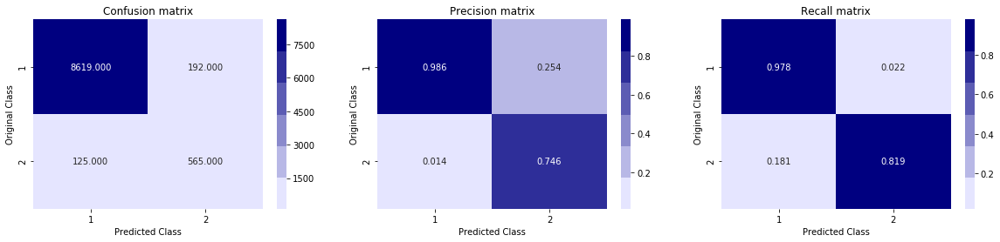

In [138]:
from sklearn.ensemble import RandomForestClassifier

RF=RandomForestClassifier()
RFG=RF.fit(X_Train_pca,Y_Train)

Y_train_pred=RFG.predict(X_Train_pca) 
Y_test_pred=RFG.predict(X_Test_pca)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### XGBoost

**********************************************************************************************************************


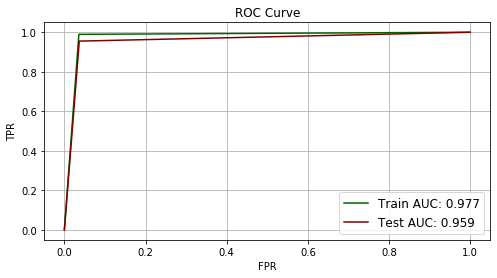

*********************************************************************************************************************

Train AUC :  0.9768489215638542
Test AUC :  0.9591501236103093
F1 Score :  0.962635512051363

**********************************************************************************************************************


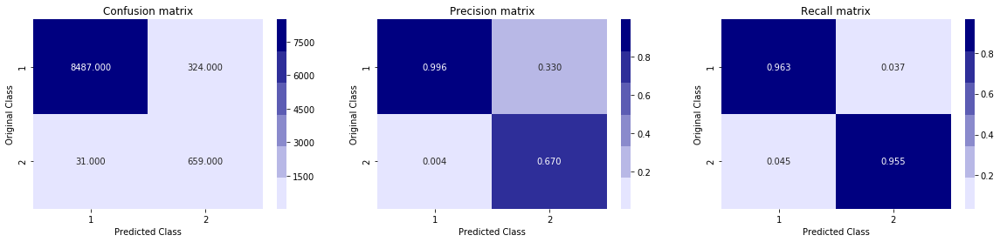

In [139]:
import xgboost as xgb

GBDT=xgb.XGBClassifier()
GBDTG=GBDT.fit(X_Train_pca,Y_Train)

Y_train_pred=GBDTG.predict(X_Train_pca)
Y_test_pred=GBDTG.predict(X_Test_pca)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Hyper Parameter Tuning

### Logistic Regression

In [160]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

parameter={'C' :[10 ** x for x in range(-5, 4)]}

LR=LogisticRegression(penalty='l2')
LRG=GridSearchCV(LR,parameter,cv=4,scoring='roc_auc',return_train_score=True)
LRG.fit(X_Train_pca,Y_Train)

results=pd.DataFrame.from_dict(LRG.cv_results_)
Best_C=LRG.best_params_['C']
Best_Score=LRG.best_score_

In [161]:
result=results.sort_values(['param_C'])
gscv_train_auc=results['mean_train_score']
gscv_CV_auc=results['mean_test_score']

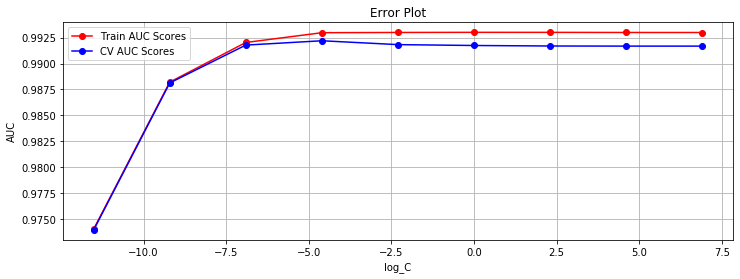

In [162]:
plt.figure(figsize=(12,4))
plt.plot(log_C,gscv_train_auc,label='Train AUC Scores',linestyle='-',marker='o',color='r')
plt.plot(log_C,gscv_CV_auc,label='CV AUC Scores',linestyle='-',marker='o',color='b')
plt.legend()
plt.xlabel('log_C')
plt.ylabel('AUC')
plt.title('Error Plot')
plt.grid()
plt.show()

In [163]:
print("Best C : ",Best_C)
print("Best Score : ",Best_Score)

Best C :  0.01
Best Score :  0.9921876185663716


#### Testing the Model With the Best Obtained Hyperparameter 'C'

**********************************************************************************************************************


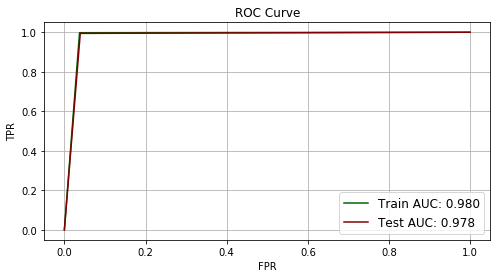

*********************************************************************************************************************

Train AUC :  0.9801353522566825
Test AUC :  0.9775236487986854
F1 Score :  0.9632670245237344

**********************************************************************************************************************


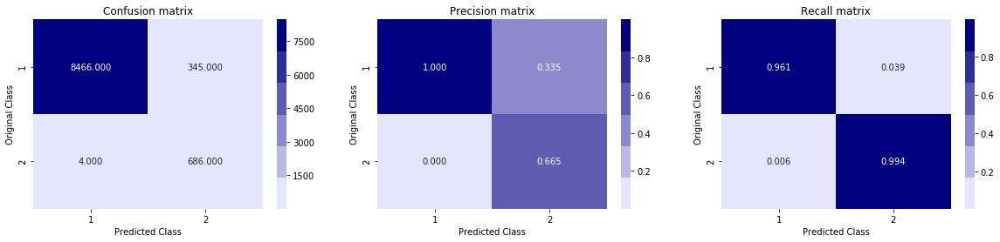

In [166]:
from sklearn.metrics import roc_curve
Best_LR=LogisticRegression(C=Best_C,n_jobs=-1)
Best_LR.fit(X_Train_pca,Y_Train)

Y_train_pred=Best_LR.predict(X_Train_pca) 
Y_test_pred=Best_LR.predict(X_Test_pca)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

In [167]:
type(Y_test_pred)

numpy.ndarray

In [165]:
dump(Best_LR, open('Best_LR_Model.pkl', 'wb'))

### XGBoost

In [145]:
import xgboost as xgb

parameters={'n_estimators':range(100,600,200), 'max_depth':range(4,9,1),'min_samples_leaf': range(10,90,20),'learning_rate':[0.01,0.05]}


GBDT=xgb.XGBClassifier()

GBDTG=GridSearchCV(GBDT,parameters,cv=3,scoring='roc_auc',return_train_score=True,n_jobs=-1,verbose=6)
GBDTG.fit(X_Train_pca,Y_Train)

GBDT_results=pd.DataFrame.from_dict(GBDTG.cv_results_)
GBDT_best_max_depth=GBDTG.best_params_['max_depth']
GBDT_best_n_estimators=GBDTG.best_params_['n_estimators']
GBDT_best_score=GBDTG.best_score_


Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 46.1min
[Parallel(n_jobs=-1)]: Done 289 tasks      | elapsed: 71.9min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 94.1min finished


In [146]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

max_depth=[]
n_estimators=[]
gscv_train_auc=[]
gscv_CV_auc=[]

for i in range(len(GBDT_results)):
    z=GBDT_results['params'][i]
    max_depth.append(z['max_depth'])
    n_estimators.append(z['n_estimators'])
    gscv_train_auc.append(GBDT_results['mean_train_score'][i])
    gscv_CV_auc.append(GBDT_results['mean_test_score'][i])

trace1 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_train_auc, name = 'Train AUC')
trace2 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_CV_auc, name = 'CV AUC')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [147]:
print('Best Max Depth : ',GBDT_best_max_depth)
print('Best n_estimators : ',GBDT_best_n_estimators)
print('Best Min Samples : ',GBDTG.best_params_['min_samples_leaf'])
print('Best Learning Rate : ',GBDTG.best_params_['learning_rate'])
print('Best Score : ',GBDT_best_score)

Best Max Depth :  8
Best n_estimators :  500
Best Min Samples :  10
Best Learning Rate :  0.05
Best Score :  0.9974914169275085


#### Testing the Performance of the Model with Best parameters Obtained

**********************************************************************************************************************


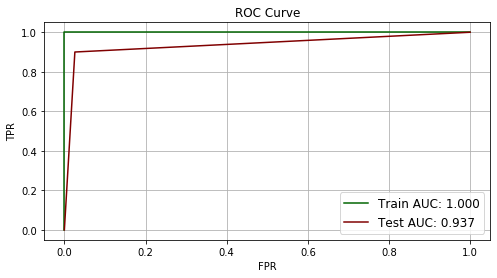

*********************************************************************************************************************

Train AUC :  1.0
Test AUC :  0.9370616275110656
F1 Score :  0.9687401326176192

**********************************************************************************************************************


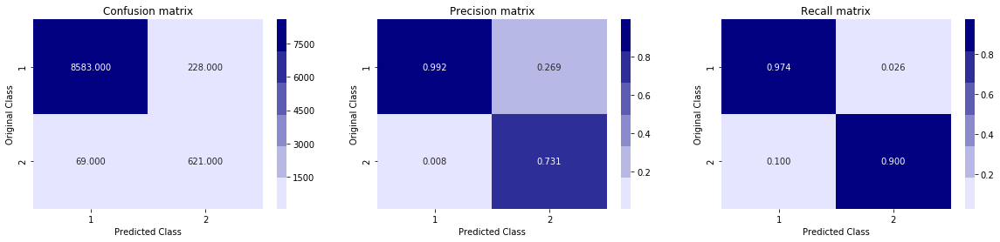

In [156]:
GBDT_DT=xgb.XGBClassifier(max_depth=GBDT_best_max_depth,n_estimators=GBDT_best_n_estimators,min_samples_leaf=GBDTG.best_params_['min_samples_leaf'],learning_rate=GBDTG.best_params_['learning_rate'])

GBDT_DT.fit(X_Train_pca,Y_Train)

GBDT_Y_train_pred=GBDT_DT.predict(X_Train_pca)
GBDT_Y_test_pred=GBDT_DT.predict(X_Test_pca)

analyze(Y_Train,GBDT_Y_train_pred,Y_test,GBDT_Y_test_pred)

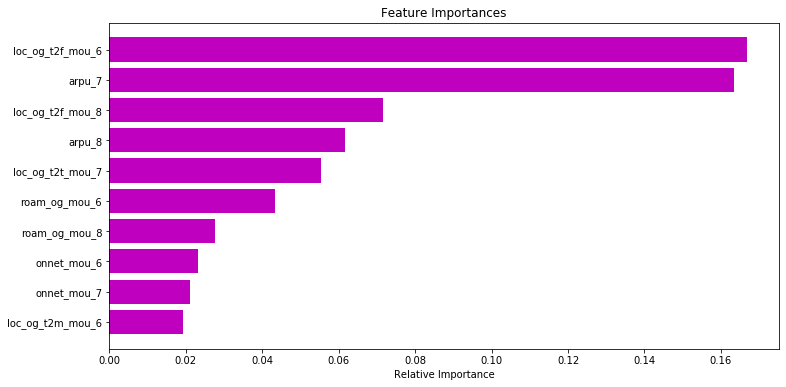

In [149]:
features = X_train.columns 
importances = GBDT_DT.feature_importances_ 
indices = (np.argsort(importances))[-10:] 
plt.figure(figsize=(12,6)) 
plt.title('Feature Importances') 
plt.barh(range(len(indices)), importances[indices], color='m') 
plt.yticks(range(len(indices)), [features[i] for i in indices]) 
plt.xlabel('Relative Importance') 
plt.show()


### Random Forest

In [150]:
parameters={'max_depth': [4,5,9,12,15],'n_estimators': [100,200,500,700]}

RF=RandomForestClassifier()

RFG=GridSearchCV(RF,parameters,cv=3,scoring='roc_auc',return_train_score=True,n_jobs=-1,verbose=6)
RFG.fit(X_Train_pca,Y_Train)

results=pd.DataFrame.from_dict(RFG.cv_results_)
RF_best_max_depth=RFG.best_params_['max_depth']
RF_best_n_estimators=RFG.best_params_['n_estimators']
RF_best_score=RFG.best_score_


Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  48 out of  60 | elapsed:  5.3min remaining:  1.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  8.0min finished


In [151]:
max_depth=[]
n_estimators=[]
gscv_train_auc=[]
gscv_CV_auc=[]

for i in range(len(results)):
    z=results['params'][i]
    max_depth.append(z['max_depth'])
    n_estimators.append(z['n_estimators'])
    gscv_train_auc.append(results['mean_train_score'][i])
    gscv_CV_auc.append(results['mean_test_score'][i])

In [152]:
trace1 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_train_auc, name = 'Train AUC')
trace2 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_CV_auc, name = 'CV AUC')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [153]:
print('Best Max Depth : ',RF_best_max_depth)
print('Best n_estimators : ',RF_best_n_estimators)
print('Best Score : ',RF_best_score)

Best Max Depth :  15
Best n_estimators :  500
Best Score :  0.9972983580988646


#### Testing the Performance of the Model with Best parameters Obtained

**********************************************************************************************************************


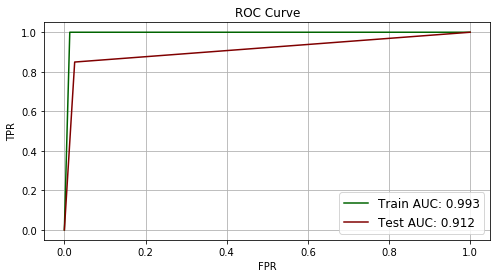

*********************************************************************************************************************

Train AUC :  0.9933297628901114
Test AUC :  0.9119262976615199
F1 Score :  0.965477318177034

**********************************************************************************************************************


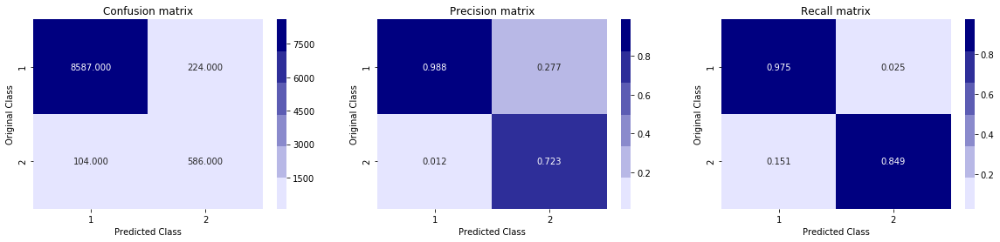

In [170]:
Best_DT=RandomForestClassifier(max_depth=RF_best_max_depth,n_estimators=RF_best_n_estimators)

Best_DT.fit(X_Train_pca,Y_Train)

RF_Y_train_pred=Best_DT.predict(X_Train_pca)
RF_Y_test_pred=Best_DT.predict(X_Test_pca)


analyze(Y_Train,RF_Y_train_pred,Y_test,RF_Y_test_pred)

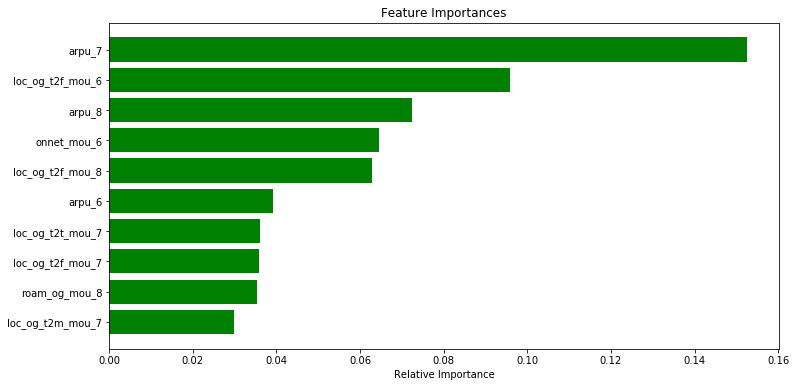

In [155]:
features = X_train.columns 
importances = Best_DT.feature_importances_ 
indices = (np.argsort(importances))[-10:] 
plt.figure(figsize=(12,6)) 
plt.title('Feature Importances') 
plt.barh(range(len(indices)), importances[indices], color='g') 
plt.yticks(range(len(indices)), [features[i] for i in indices]) 
plt.xlabel('Relative Importance') 
plt.show()


### Dimensionality Reduction

### SelectKBest

#### Finding Best K

In [211]:
from sklearn.feature_selection import SelectKBest, f_classif

scores=[]
for x in tqdm(range(10,70)):
    featurizer=SelectKBest(k=x)
    featurizer.fit(X_train,Y_train)

    X_Train_k=featurizer.transform(X_Train)
    X_Test_k=featurizer.transform(X_Test_std)

    LRS = LogisticRegression()
    LRSF = LRS.fit(X_Train_k,Y_Train)

    Y_train_pred=LRSF.predict(X_Train_k)
    Y_test_pred=LRSF.predict(X_Test_k)
    scores.append(roc_auc_score(Y_test,Y_test_pred))
score=np.array(scores)
bestk=10+np.argmax(score)
print(bestk)


34


In [212]:
featurizer=SelectKBest(k=bestk)
featurizer.fit(X_train,Y_train)

X_Train_k=featurizer.transform(X_Train)
X_Test_k=featurizer.transform(X_Test_std)

In [242]:
dump(featurizer, open('SelectKBest_34.pkl', 'wb'))

## Models

### Simple Models With Default Parameters

### KNN

**********************************************************************************************************************


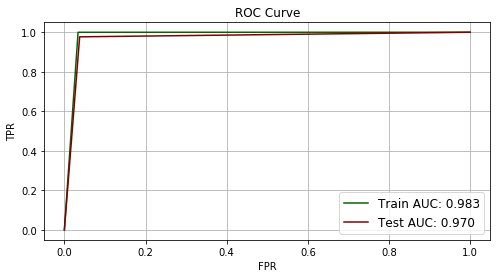

*********************************************************************************************************************

Train AUC :  0.9830079361215248
Test AUC :  0.9695657108456327
F1 Score :  0.9633722766024628

**********************************************************************************************************************


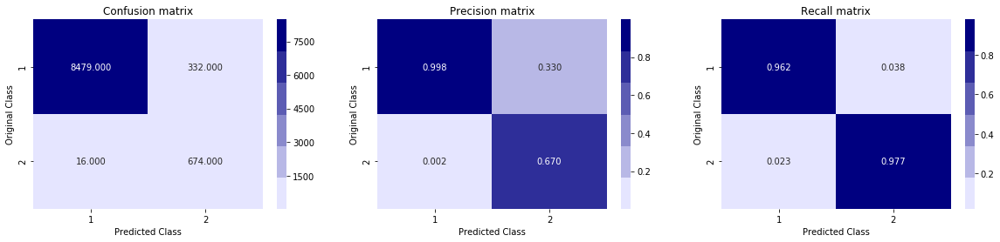

In [214]:
KNN = KNeighborsClassifier()
KNNF = KNN.fit(X_Train_k,Y_Train)

Y_train_pred=KNNF.predict(X_Train_k)
Y_test_pred=KNNF.predict(X_Test_k)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Logistic Regression

**********************************************************************************************************************


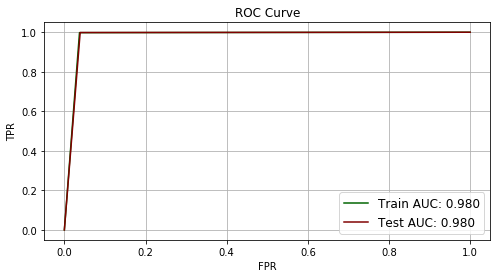

*********************************************************************************************************************

Train AUC :  0.9803301037051465
Test AUC :  0.9798110563376808
F1 Score :  0.9637932849173771

**********************************************************************************************************************


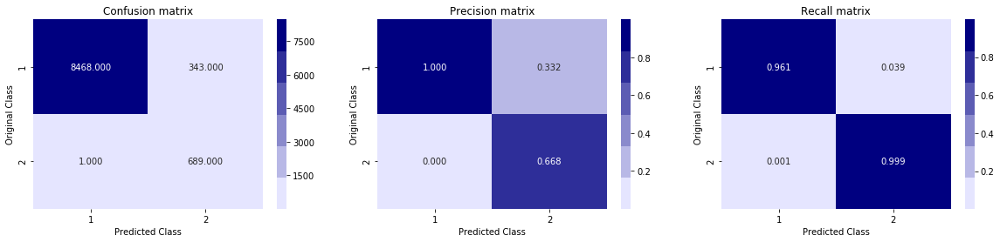

In [215]:
from sklearn.linear_model import LogisticRegression

LRS = LogisticRegression()
LRSF = LRS.fit(X_Train_k,Y_Train)

Y_train_pred=LRSF.predict(X_Train_k)
Y_test_pred=LRSF.predict(X_Test_k)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Random Forest

**********************************************************************************************************************


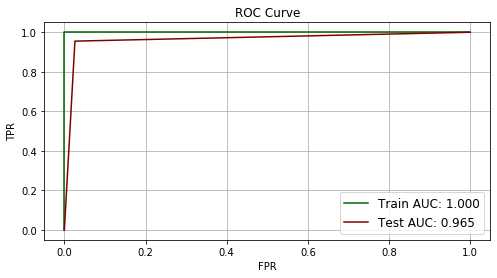

*********************************************************************************************************************

Train AUC :  1.0
Test AUC :  0.9645411121473653
F1 Score :  0.9726344595305757

**********************************************************************************************************************


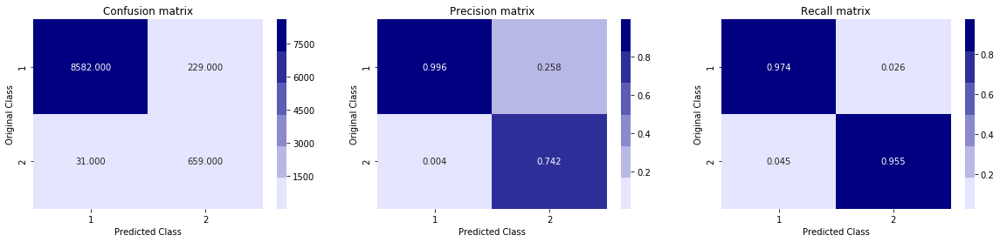

In [216]:
from sklearn.ensemble import RandomForestClassifier

RF=RandomForestClassifier()
RFG=RF.fit(X_Train_k,Y_Train)

Y_train_pred=RFG.predict(X_Train_k) 
Y_test_pred=RFG.predict(X_Test_k)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### XGBoost

**********************************************************************************************************************


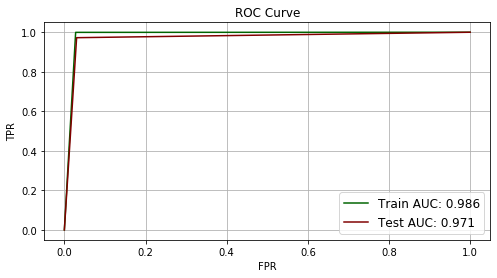

*********************************************************************************************************************

Train AUC :  0.9857831442621355
Test AUC :  0.9711371161542143
F1 Score :  0.9700031575623619

**********************************************************************************************************************


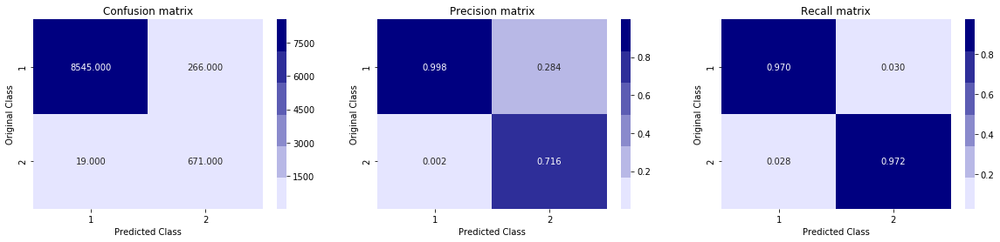

In [217]:
import xgboost as xgb

GBDT=xgb.XGBClassifier()
GBDTG=GBDT.fit(X_Train_k,Y_Train)

Y_train_pred=GBDTG.predict(X_Train_k)
Y_test_pred=GBDTG.predict(X_Test_k)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

### Hyper Parameter Tuning

### Logistic Regression

In [218]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

parameter={'C' :[10 ** x for x in range(-5, 4)]}

LR=LogisticRegression(penalty='l2')
LRG=GridSearchCV(LR,parameter,cv=4,scoring='roc_auc',return_train_score=True)
LRG.fit(X_Train_k,Y_Train)

results=pd.DataFrame.from_dict(LRG.cv_results_)
Best_C=LRG.best_params_['C']
Best_Score=LRG.best_score_

In [219]:
result=results.sort_values(['param_C'])
gscv_train_auc=results['mean_train_score']
gscv_CV_auc=results['mean_test_score']

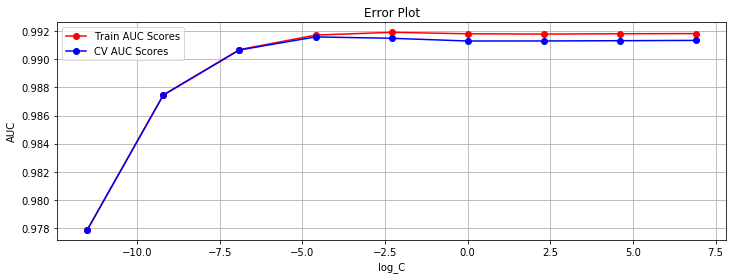

In [220]:
plt.figure(figsize=(12,4))
plt.plot(log_C,gscv_train_auc,label='Train AUC Scores',linestyle='-',marker='o',color='r')
plt.plot(log_C,gscv_CV_auc,label='CV AUC Scores',linestyle='-',marker='o',color='b')
plt.legend()
plt.xlabel('log_C')
plt.ylabel('AUC')
plt.title('Error Plot')
plt.grid()
plt.show()

In [221]:
print("Best C : ",Best_C)
print("Best Score : ",Best_Score)

Best C :  0.01
Best Score :  0.991584933985463


#### Testing the Model With the Best Obtained Hyperparameter 'C'

**********************************************************************************************************************


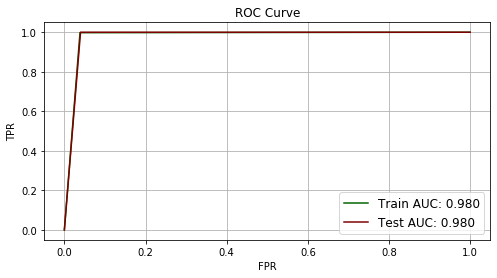

*********************************************************************************************************************

Train AUC :  0.9796241297044648
Test AUC :  0.9800817160367722
F1 Score :  0.9630565203662772

**********************************************************************************************************************


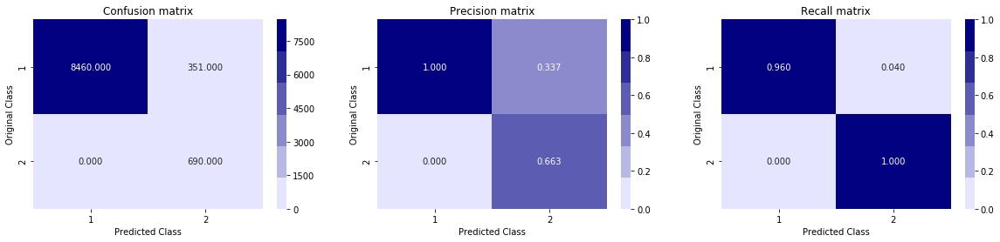

In [243]:
from sklearn.metrics import roc_curve
Best_LR=LogisticRegression(C=Best_C,n_jobs=-1)
Best_LR.fit(X_Train_k,Y_Train)

Y_train_pred=Best_LR.predict(X_Train_k) 
Y_test_pred=Best_LR.predict(X_Test_k)

analyze(Y_Train,Y_train_pred,Y_test,Y_test_pred)

In [244]:
dump(Best_LR, open('Best_LR_Model_KBest.pkl', 'wb'))

### XGBoost

In [223]:
import xgboost as xgb

parameters={'n_estimators':range(100,600,200), 'max_depth':range(4,9,1),'min_samples_leaf': range(10,90,20),'learning_rate':[0.01,0.05]}


GBDT=xgb.XGBClassifier()

GBDTG=GridSearchCV(GBDT,parameters,cv=3,scoring='roc_auc',return_train_score=True,n_jobs=-1,verbose=6)
GBDTG.fit(X_Train_k,Y_Train)

GBDT_results=pd.DataFrame.from_dict(GBDTG.cv_results_)
GBDT_best_max_depth=GBDTG.best_params_['max_depth']
GBDT_best_n_estimators=GBDTG.best_params_['n_estimators']
GBDT_best_score=GBDTG.best_score_


Fitting 3 folds for each of 120 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 289 tasks      | elapsed: 23.8min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed: 31.2min finished


In [224]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

max_depth=[]
n_estimators=[]
gscv_train_auc=[]
gscv_CV_auc=[]

for i in range(len(GBDT_results)):
    z=GBDT_results['params'][i]
    max_depth.append(z['max_depth'])
    n_estimators.append(z['n_estimators'])
    gscv_train_auc.append(GBDT_results['mean_train_score'][i])
    gscv_CV_auc.append(GBDT_results['mean_test_score'][i])

trace1 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_train_auc, name = 'Train AUC')
trace2 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_CV_auc, name = 'CV AUC')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [225]:
print('Best Max Depth : ',GBDT_best_max_depth)
print('Best n_estimators : ',GBDT_best_n_estimators)
print('Best Min Samples : ',GBDTG.best_params_['min_samples_leaf'])
print('Best Learning Rate : ',GBDTG.best_params_['learning_rate'])
print('Best Score : ',GBDT_best_score)

Best Max Depth :  7
Best n_estimators :  500
Best Min Samples :  10
Best Learning Rate :  0.05
Best Score :  0.9989156255810472


#### Testing the Performance of the Model with Best parameters Obtained

**********************************************************************************************************************


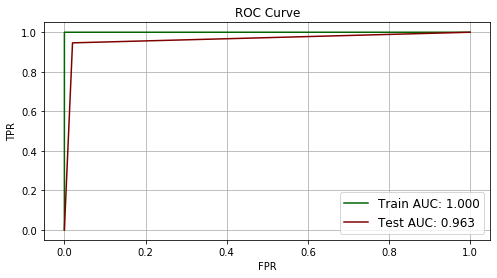

*********************************************************************************************************************

Train AUC :  0.999951312137884
Test AUC :  0.9631441429438498
F1 Score :  0.9774760551520892

**********************************************************************************************************************


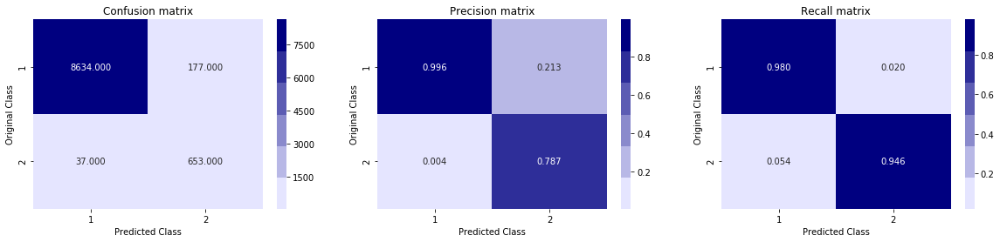

In [226]:
GBDT_DT=xgb.XGBClassifier(max_depth=GBDT_best_max_depth,n_estimators=GBDT_best_n_estimators,min_samples_leaf=GBDTG.best_params_['min_samples_leaf'],learning_rate=GBDTG.best_params_['learning_rate'])

GBDT_DT.fit(X_Train_k,Y_Train)

GBDT_Y_train_pred=GBDT_DT.predict(X_Train_k)
GBDT_Y_test_pred=GBDT_DT.predict(X_Test_k)

analyze(Y_Train,GBDT_Y_train_pred,Y_test,GBDT_Y_test_pred)

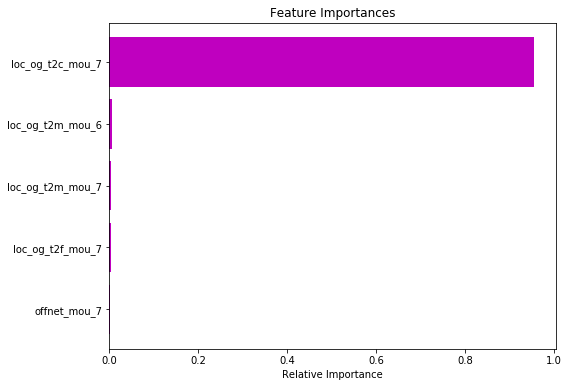

In [235]:
features = X_train.columns 
importances = GBDT_DT.feature_importances_ 
indices = (np.argsort(importances))[-5:] 
plt.figure(figsize=(8,6)) 
plt.title('Feature Importances') 
plt.barh(range(len(indices)), importances[indices], color='m') 
plt.yticks(range(len(indices)), [features[i] for i in indices]) 
plt.xlabel('Relative Importance') 
plt.show()


### Random Forest

In [228]:
parameters={'max_depth': [4,5,9,12,15],'n_estimators': [100,200,500,700]}

RF=RandomForestClassifier()

RFG=GridSearchCV(RF,parameters,cv=3,scoring='roc_auc',return_train_score=True,n_jobs=-1,verbose=6)
RFG.fit(X_Train_k,Y_Train)

results=pd.DataFrame.from_dict(RFG.cv_results_)
RF_best_max_depth=RFG.best_params_['max_depth']
RF_best_n_estimators=RFG.best_params_['n_estimators']
RF_best_score=RFG.best_score_


Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   54.8s
[Parallel(n_jobs=-1)]: Done  48 out of  60 | elapsed:  2.0min remaining:   30.3s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished


In [229]:
max_depth=[]
n_estimators=[]
gscv_train_auc=[]
gscv_CV_auc=[]

for i in range(len(results)):
    z=results['params'][i]
    max_depth.append(z['max_depth'])
    n_estimators.append(z['n_estimators'])
    gscv_train_auc.append(results['mean_train_score'][i])
    gscv_CV_auc.append(results['mean_test_score'][i])

In [230]:
trace1 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_train_auc, name = 'Train AUC')
trace2 = go.Scatter3d(x=n_estimators,y=max_depth,z=gscv_CV_auc, name = 'CV AUC')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [231]:
print('Best Max Depth : ',RF_best_max_depth)
print('Best n_estimators : ',RF_best_n_estimators)
print('Best Score : ',RF_best_score)

Best Max Depth :  15
Best n_estimators :  500
Best Score :  0.9982004928472352


#### Testing the Performance of the Model with Best parameters Obtained

**********************************************************************************************************************


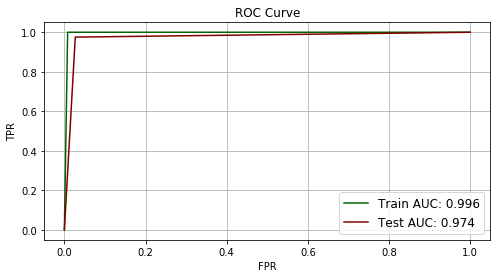

*********************************************************************************************************************

Train AUC :  0.9959589074443741
Test AUC :  0.9742320617015293
F1 Score :  0.9732659720029471

**********************************************************************************************************************


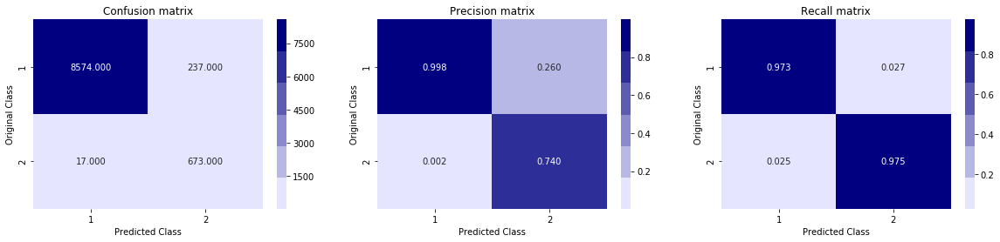

In [232]:
Best_DT=RandomForestClassifier(max_depth=RF_best_max_depth,n_estimators=RF_best_n_estimators)

Best_DT.fit(X_Train_k,Y_Train)

RF_Y_train_pred=Best_DT.predict(X_Train_k)
RF_Y_test_pred=Best_DT.predict(X_Test_k)


analyze(Y_Train,RF_Y_train_pred,Y_test,RF_Y_test_pred)

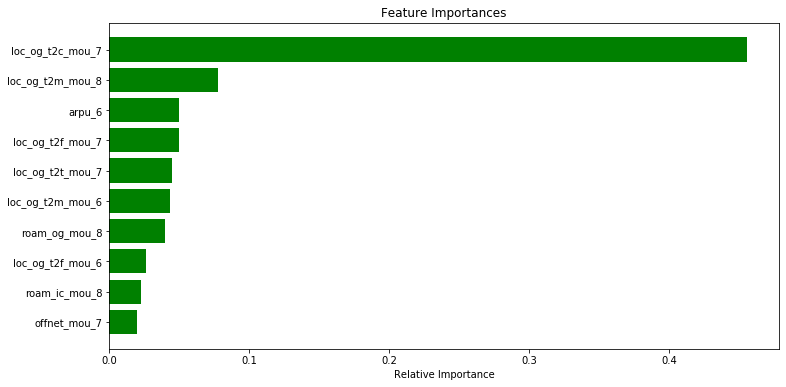

In [233]:
features = X_train.columns 
importances = Best_DT.feature_importances_ 
indices = (np.argsort(importances))[-10:] 
plt.figure(figsize=(12,6)) 
plt.title('Feature Importances') 
plt.barh(range(len(indices)), importances[indices], color='g') 
plt.yticks(range(len(indices)), [features[i] for i in indices]) 
plt.xlabel('Relative Importance') 
plt.show()


### Conclusions

In [240]:
from prettytable import PrettyTable

conclusion0=PrettyTable()
conclusion0.field_names=["Model","Test Score","F1 Score"]
conclusion0.add_row(["KNN","92.45 %",0.9392])
conclusion0.add_row(["Logistic Regression","97.19 %",0.9665])
conclusion0.add_row(["Random Forest","92.93 %",0.9755])
conclusion0.add_row(["XGBoost","97.54 %",0.9730])

conclusion01=PrettyTable()
conclusion01.field_names=["Model","Hyperparameter","Test Score","F1 Score"]
conclusion01.add_row(["Logistic Regression\n\n",0.01,"97.62 %",0.9633])


conclusion1=PrettyTable()
conclusion1.field_names=["Model","Test Score","F1 Score"]
conclusion1.add_row(["KNN","93.42 %",0.9449])
conclusion1.add_row(["Logistic Regression","97.62  %",0.9645])
conclusion1.add_row(["Random Forest","89.85 %",0.9666])
conclusion1.add_row(["XGBoost","95.91 %",0.9626])

conclusion11=PrettyTable()
conclusion11.field_names=["Model","Hyperparameter","Test Score","F1 Score"]
conclusion11.add_row(["Logistic Regression\n\n",0.01,"97.75 %",0.9632])
conclusion11.add_row(["Random Forest\n\n\n","Best Max Depth :  15\n Best n_estimators :  500","91.19 %",0.9654])
conclusion11.add_row(["XGBoost"," Max Depth :  8\n n_estimators :  500\n Best Min Samples :  10\n Best Learning Rate :  0.05","93.70 %",0.9687])

conclusion2=PrettyTable()
conclusion2.field_names=["Model","Test Score","F1 Score"]
conclusion2.add_row(["KNN","96.95 %",0.9633])
conclusion2.add_row(["Logistic Regression","97.98  %",0.9637])
conclusion2.add_row(["Random Forest","96.45 %",0.9726])
conclusion2.add_row(["XGBoost","97.11 %",0.9700])

conclusion21=PrettyTable()
conclusion21.field_names=["Model","Hyperparameter","Test Score","F1 Score"]
conclusion21.add_row(["Logistic Regression\n\n",0.01,"98.00 %",0.9630])
conclusion21.add_row(["Random Forest\n\n\n","Best Max Depth :  15\n Best n_estimators :  500","97.42 %",0.732])
conclusion21.add_row(["XGBoost"," Max Depth :  7\n n_estimators :  500\n Best Min Samples :  10\n Best Learning Rate :  0.05","96.31 %",0.9774])


print("********************************* WITHOUT DIMENSIONALITY REDUCTION **********************************\n")
print("***************************************** Simple Models *********************************************\n")
print(conclusion0)
print("****************************************** Tuned Models *********************************************\n")
print(conclusion01)

print("\n\n*************************** WITH DIMENSIONALITY REDUCTION PCA **********************************\n")
print("***************************************** Simple Models *********************************************\n")
print(conclusion1)
print("****************************************** Tuned Models *********************************************\n")
print(conclusion11)

print("\n\n************************ WITH DIMENSIONALITY REDUCTION selectKBest **********************************\n")
print("***************************************** Simple Models *********************************************\n")
print(conclusion2)
print("****************************************** Tuned Models *********************************************\n")
print(conclusion21)

********************************* WITHOUT DIMENSIONALITY REDUCTION **********************************

***************************************** Simple Models *********************************************

+---------------------+------------+----------+
|        Model        | Test Score | F1 Score |
+---------------------+------------+----------+
|         KNN         |  92.45 %   |  0.9392  |
| Logistic Regression |  97.19 %   |  0.9665  |
|    Random Forest    |  92.93 %   |  0.9755  |
|       XGBoost       |  97.54 %   |  0.973   |
+---------------------+------------+----------+
****************************************** Tuned Models *********************************************

+---------------------+----------------+------------+----------+
|        Model        | Hyperparameter | Test Score | F1 Score |
+---------------------+----------------+------------+----------+
| Logistic Regression |      0.01      |  97.62 %   |  0.9633  |
|                     |                |       

#### Observations

 - Most of the Important Features are Minutes of Usage of Outgoing Calls.
 - ARPU is also an Important Feature in Prediciting The Risk of Churn.
 - Onnet and Offnet MOU of August Month are also Important Features in Predicting Risk of Churn.

### Steps Followed and Inferences :


 - Reading Data.
 - Understanding the Data.
 - Preprocessing the Data.
     - Handling Missing Values.
         - About 80% of Columns have less than 10% Missing Data i.e ~10,000 Data Points.
         - About 10% of Columns have More Than 70% of Missing Data i.e ~70,000 Data Points.
         - Removed Columns with Missing Values >30%
         - Handled the Remained Columns with Time Series Data i.e Past Data.
 - Customer Value Segmentation
     - Filtered The High Value Customers by Decile Analysis i.e Customers Generating more than 70% Revenue to the Company.
 - Labeling the Data
     - Churn Label is assigned to the Customers, based on the Latest Month Data.
     - Depending on the total_ic_mou_, total_og_mou, vol_2g_mb, total_rech_num. i.e.
         - No Incoming and Outgoing Callls.
         - No Data Usage, either 2G or 3G.
         - No Recharges have been Done.
 - Exploratory Data Analysis
     - It was Observed that the Data is Highly Imbalanced. i.e. Only 7.326 % points are Churned.
     - Most of The Data s Overlapped.
     - The Call Duration's made by the Churned Customer's to the Other Network's in the Month of August Decreased Drastically when Compared with the Previous Month's MOU and it's Very Low.
     - Outgoing MOU of Churned Customer's is Very Low in the Month of August.
     - Incoming Call MOU for Chuned Customer's is Very Low and it's very low in the month of August .
     - Higher the Number of Recharges, lesser the Churn Rate.
     - For Churned Customer's, Data Usage Has been Decreased when compared with Previous Months Usage.
     - As the Age on Network is High the Churn Rate is Low.
     - Churn Rate is Lower if Age on Network is above 1000.
     - Most of the Churned Customer's haven't done Recharge in the Month of August.
     
  - Deriving Features
      - Based on the above analysis and domain knowledge, 13 Features have been derived.
  - Splitting The Data
      - Data had been splitted in the ratio of 70:30.
  - Standardizing The Data
      - Data has been standardized using StandardScaler()
  - Upsampling
      - As, the data is highly imbalanced, upsampling is performed using SMOTE.
      - Where Synthetic Artifical New Datapoints have been created.
  - Baseline Models were Built on top of this Data.
  - Dimensionality Reduction has been performed as there was high correlation between the Features.
      - PCA
          - Using the Cummulative Explained Variance, the number of components had been decided and it was 65 for 95% Explained Variance.
      - SelectKBest
          - Best K has been found out, and it was 34.
   - Models were built on top of this Data
   - Models built on Reduced Dimensionality with SelectKBest had performed the Best.
   - Logistic Regression in all the above cases gave the Best Results.
  
      
     
     